# Desafio de pervisão metorológica 

### Criação de um modelo de predição de temperatura e chuvas num horizonte de 1 ano a a partir de um dataset com dados de 10 a anos com dados coletaos de hora em hora. trata-se de um modeo de serie temporal mutivariada, uma vez que estão disponíveis dados de outras variáveis que tem correlação com as variáveis alvo

In [140]:
from pandas import read_csv, to_datetime
import pandas as pd
import numpy as np
from copy import deepcopy
import plotly.express as px
from sklearn.ensemble import IsolationForest
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.seasonal import seasonal_decompose, MSTL
import matplotlib.pyplot as plt
from scipy.stats import shapiro, anderson
import seaborn as sns
from skopt import BayesSearchCV
from statsmodels.tsa.statespace.sarimax import SARIMAX	
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from prophet import Prophet
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.metrics import mean_absolute_error, mean_squared_error
from IPython.display import clear_output
from json import dumps


### Carregamento dos dados

In [ ]:
class __Dados__(): 
    def __init__(self): self.__dados = read_csv('data/HISTORICO.csv', sep=',')
    def brutos(self):
        """
        Garante accesso a dados intalterados
        """
        return deepcopy(self.__dados)  
    
    def DropFeatures(self, columns:list[str]): 
        """
        Garante accesso a dados originas sem as colunas especificadas
        """
        if len(columns) ==  0: return deepcopy(self.__dados)
        
        new_dset = deepcopy(self.__dados) 
        for col in columns:
            new_dset.drop(col, axis=1, inplace=True)
        return  new_dset    
    
g_Dados = __Dados__() 

### Inspecão de dados faltantes. Não ha dados faltantes

In [6]:
def AssertMissingData():
    """
    Asserção simples após inspeção inicla deque não havia dados faltantes
    só pra garantir
    """    
    data = g_Dados.brutos()
    for column in data.columns:
        assert data[column].dropna(inplace=False).shape[0] == data[column].shape[0] 
        
AssertMissingData()        

In [7]:
g_Dados.brutos().head()

,time,temperature_2m (°C),relative_humidity_2m (%),rain (mm),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_moisture_0_to_7cm (m³/m³)
0,2010-01-01T00:00,22.5,28,0.0,1014.7,839.5,65,5.7,10.1,252,253,20.2,23.4,0.099
1,2010-01-01T01:00,21.0,35,0.0,1015.6,839.5,55,3.1,5.8,249,277,10.1,21.2,0.099
2,2010-01-01T02:00,19.7,46,0.0,1016.0,839.1,49,1.8,1.8,191,307,7.9,19.6,0.099
3,2010-01-01T03:00,18.2,44,0.0,1017.0,839.1,47,4.0,2.5,185,225,8.3,18.2,0.099
4,2010-01-01T04:00,16.8,48,0.0,1017.5,838.8,46,5.0,4.5,180,194,9.4,17.1,0.099


# Reamostragem para redução de dimensionalidade e remoção de outliers
* Nessa célula rezalizei duas decomposições (para acelerara cmomputação: a decomposição com multiplos componetes sazonais é mais demorada) dos componetes de tendençia, sazonalidade e resíduo. As figuras mostram apenas uma das variaveis alvo: temperatura
* Como seria de se experar os, dados mostram dois componetes sazonais, ambas com bastante ruído no residio: 
  * Um anual (Figura 1), 
  * Outra diaria (Figura 2). na deccomposição diária a sazonalidade é capturada tendência
* Para acelerar as computções resolvi aplicar uma reamostragem pela fequencia diária (Figura 3), isso ocasionou
  * Perda de resolução temporal do modelo, cujo menor horizonte de predição se tormna diário, mas por outro lado
  * Reduz a dimensionalidade, facilitando as computações
  * Remove parte do ruído no resíduo e melhora a relação sinal/ruido

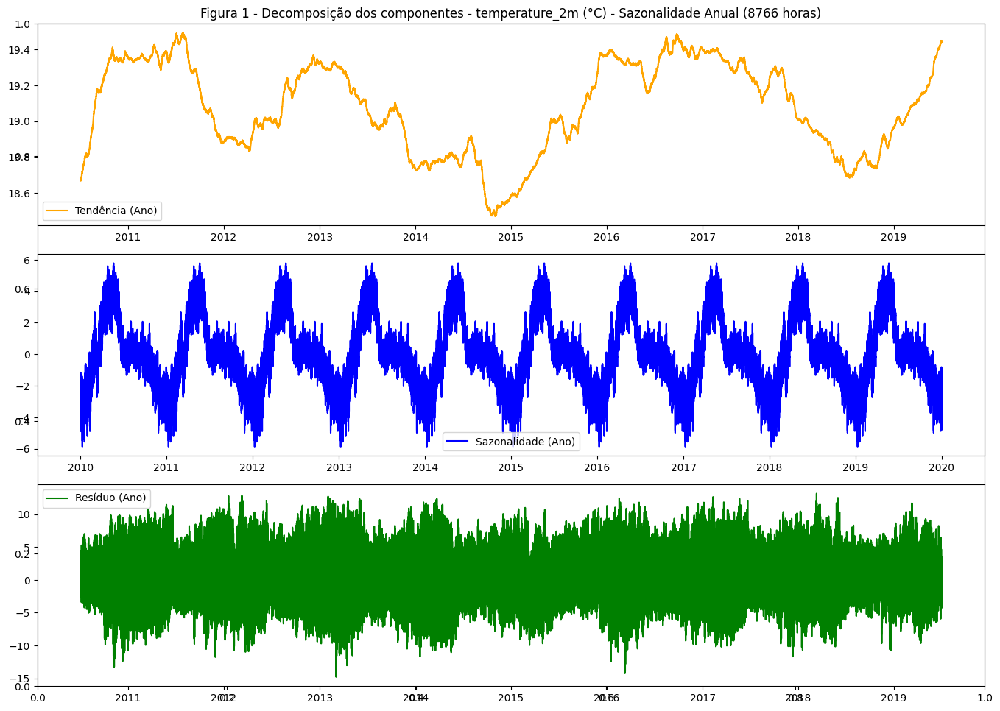

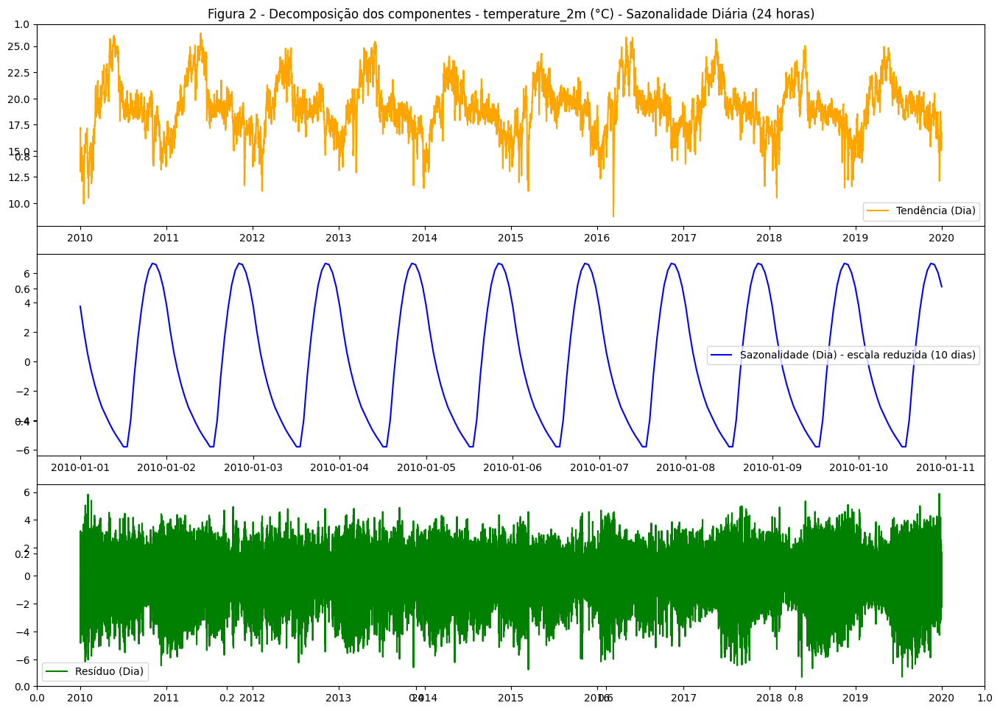

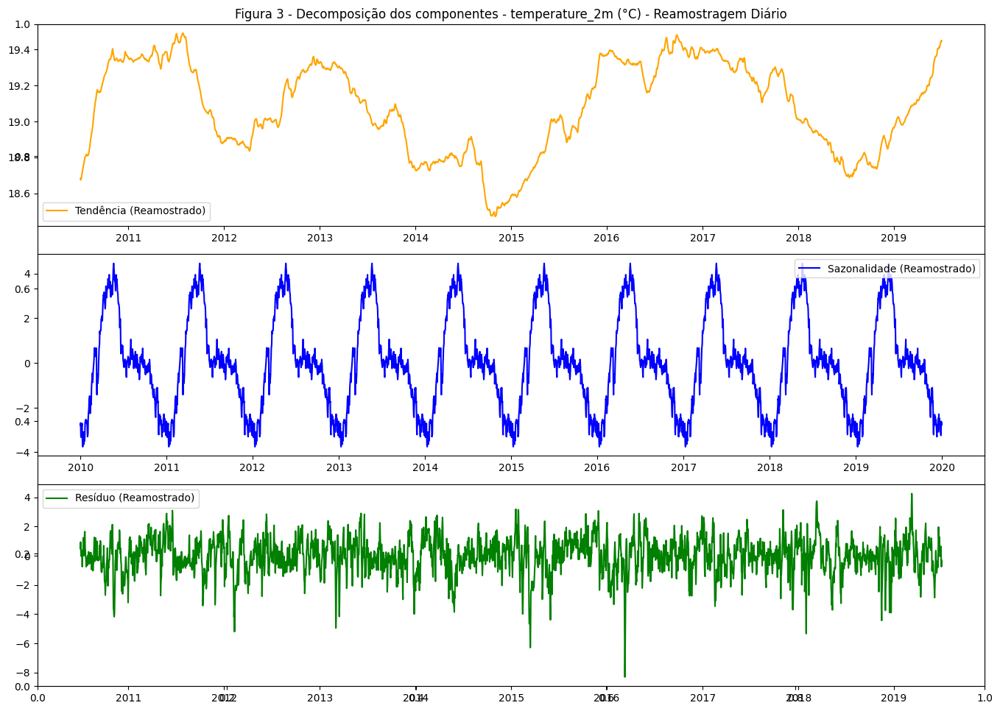

In [168]:
def CompareResampling(plot=False):
    raw_data         = g_Dados.brutos()
    raw_data['time'] = to_datetime(raw_data['time'])
    resampled_data   = raw_data.set_index('time').resample('1D').mean()
    #print(raw_data.columns, resampled_data.columns)

    col = 'temperature_2m (°C)'
    raw_decomposition_year  = seasonal_decompose(raw_data.set_index('time')[col], model='additive', period=8766)
    raw_decomposition_day   = seasonal_decompose(raw_data.set_index('time')[col], model='additive', period=24)
    resampled_decomposition = seasonal_decompose(resampled_data[col], model='additive', period=365)
    
    if not plot:
        return resampled_data

    # Plot decomposição anual (8766)
    plt.figure(figsize=(14, 10))
    plt.title('Figura 1 - Decomposição dos componentes - temperature_2m (°C) - Sazonalidade Anual (8766 horas)')
    plt.subplot(311)
    plt.plot(raw_decomposition_year.trend, label='Tendência (Ano)', color='orange')
    plt.legend()
    plt.subplot(312)
    plt.plot(raw_decomposition_year.seasonal, label='Sazonalidade (Ano)', color='blue')
    plt.legend()
    plt.subplot(313)
    plt.plot(raw_decomposition_year.resid, label='Resíduo (Ano)', color='green')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot decomposição diária (24)
    plt.figure(figsize=(14, 10))
    plt.title('Figura 2 - Decomposição dos componentes - temperature_2m (°C) - Sazonalidade Diária (24 horas)')
    plt.subplot(311)
    plt.plot(raw_decomposition_day.trend, label='Tendência (Dia)', color='orange')
    plt.legend()
    plt.subplot(312)
    plt.plot(raw_decomposition_day.seasonal[0:24*10], label='Sazonalidade (Dia) - escala reduzida (10 dias)', color='blue')
    plt.legend()
    plt.subplot(313)
    plt.plot(raw_decomposition_day.resid, label='Resíduo (Dia)', color='green')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot decomposição dos dados reamostrados (365)
    plt.figure(figsize=(14, 10))
    plt.title('Figura 3 - Decomposição dos componentes - temperature_2m (°C) - Reamostragem Diário')
    plt.subplot(311)
    plt.plot(resampled_decomposition.trend, label='Tendência (Reamostrado)', color='orange')
    plt.legend()
    plt.subplot(312)
    plt.plot(resampled_decomposition.seasonal, label='Sazonalidade (Reamostrado)', color='blue')
    plt.legend()
    plt.subplot(313)
    plt.plot(resampled_decomposition.resid, label='Resíduo (Reamostrado)', color='green')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return resampled_data

g_DadosFiltrados = CompareResampling(True)

# Inputação de outliers

* Nessa célula, fiz a decompisição e apliquei o z-score robusto ou Isolation Forests no resíduo de todas as variáveis, para detectar os indiçẽs dos outliers
* Em seguida, subistitui os valoes dos outliers por nans
* Finalmente usei um KNNImputer para subistituir os nans pelas medias dos 2 visinhos
* Numa simples inspeção visual z-score robusto foi ais eficaz na remoçãodos outliers
* O gráficos mostram para cada variável, o séria original (com a reamostragem feita no passo anterior), a inputação de outliers com z-score robusto ou Isolation Forests, além dos resíduos com os limites superiore inferior do z-score robusto (3)

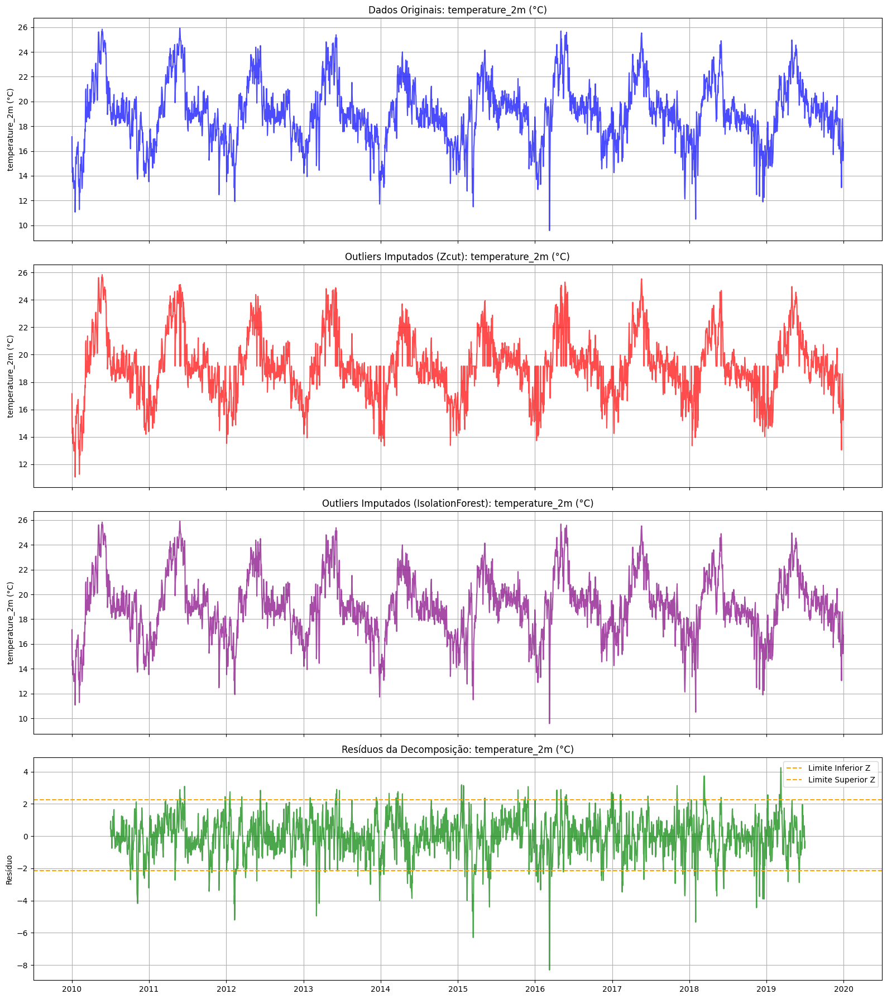

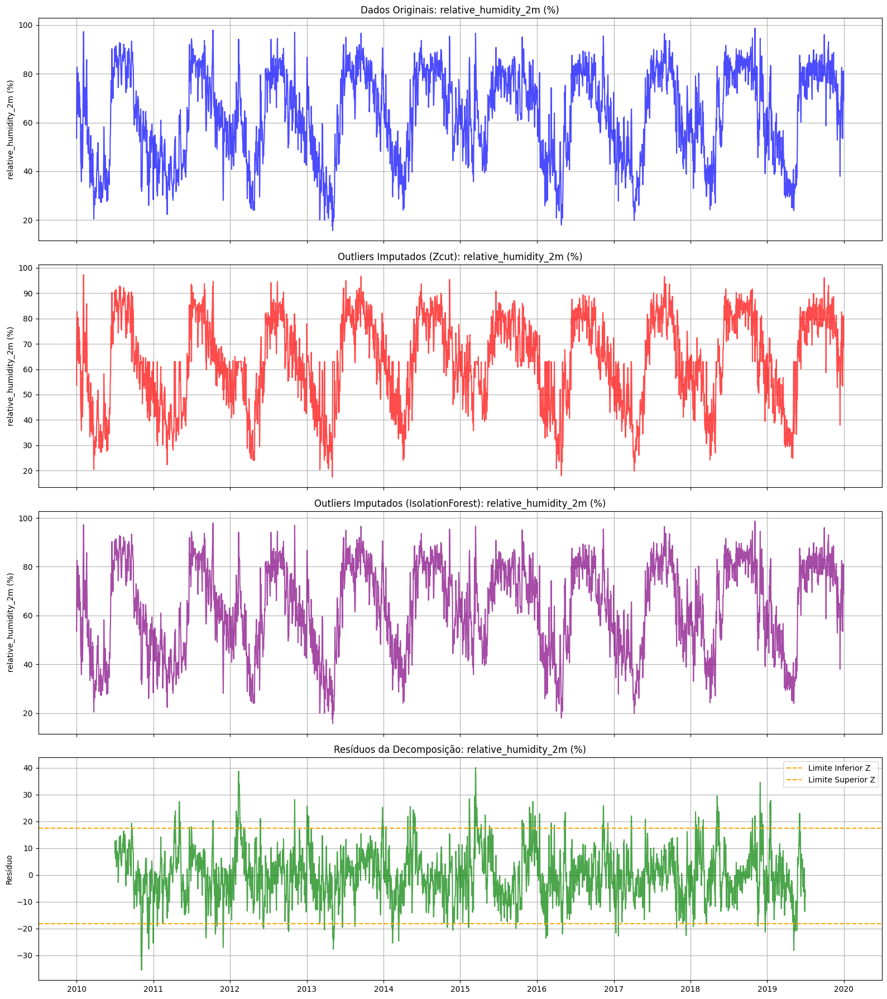

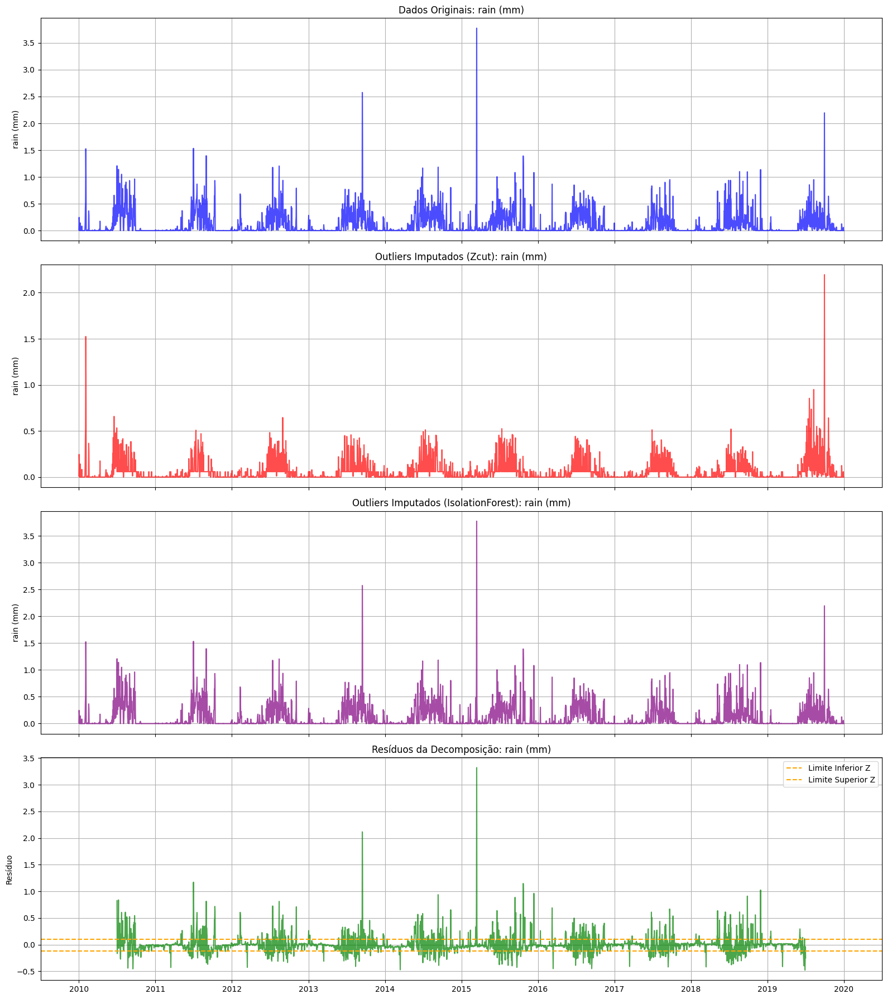

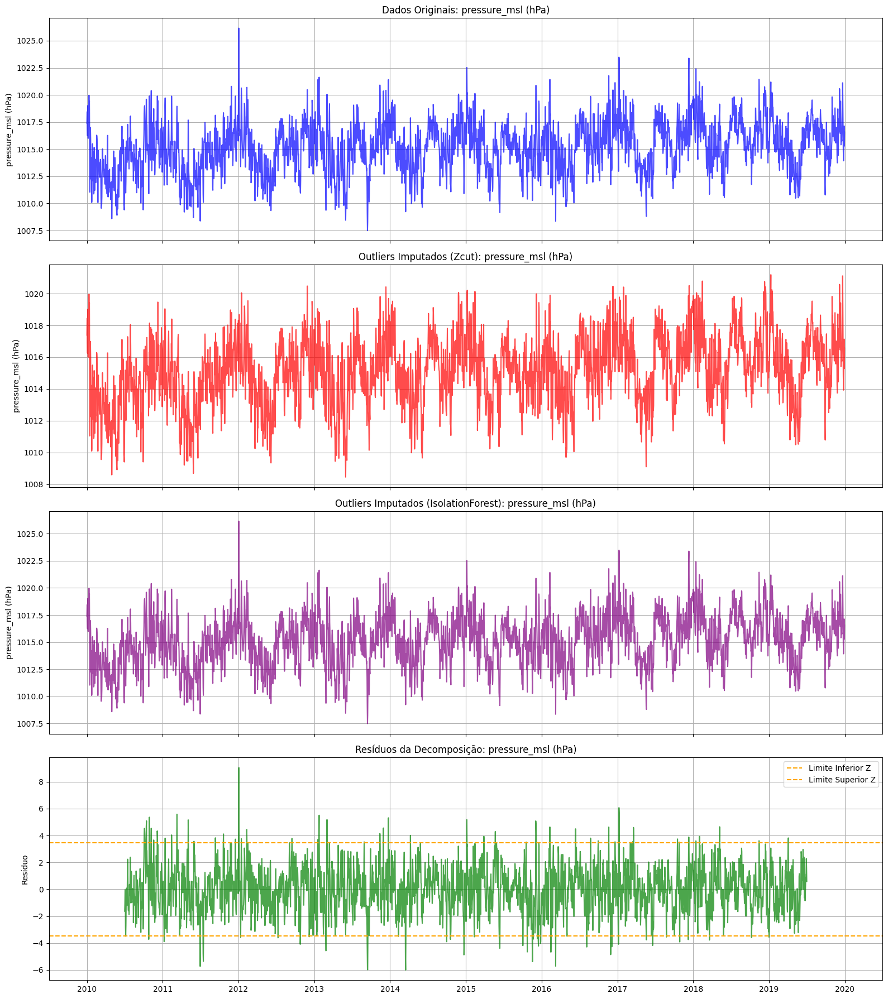

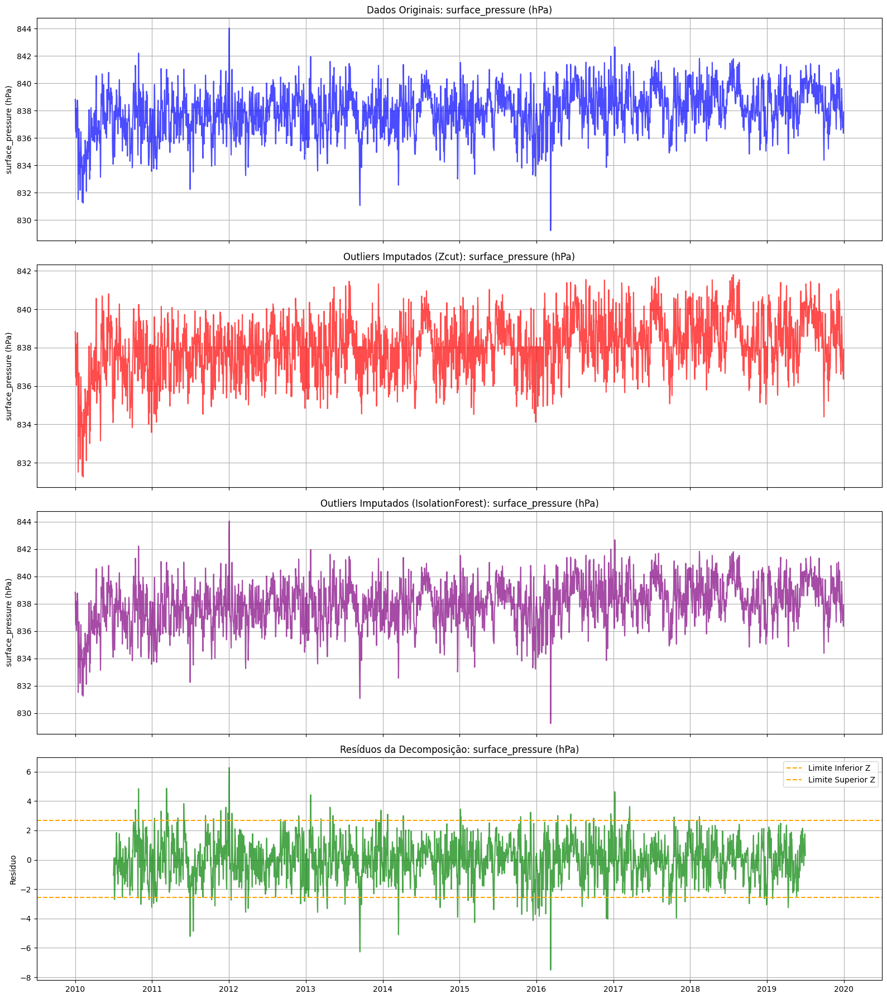

...

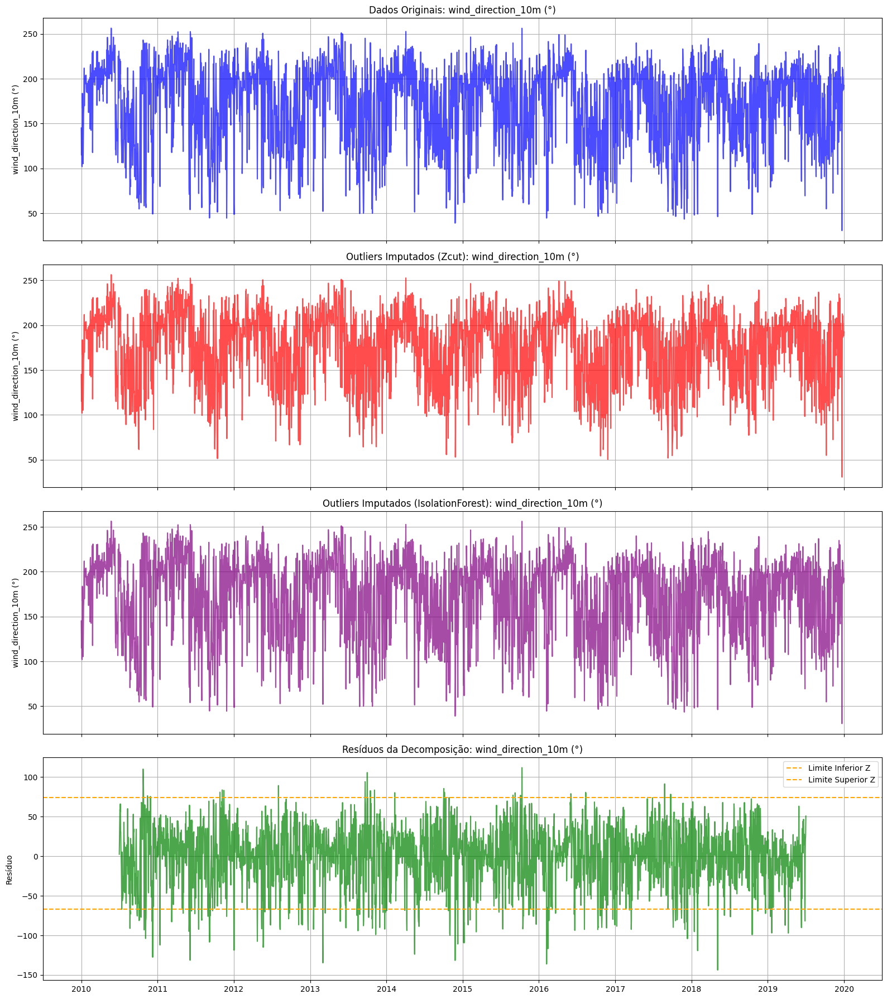

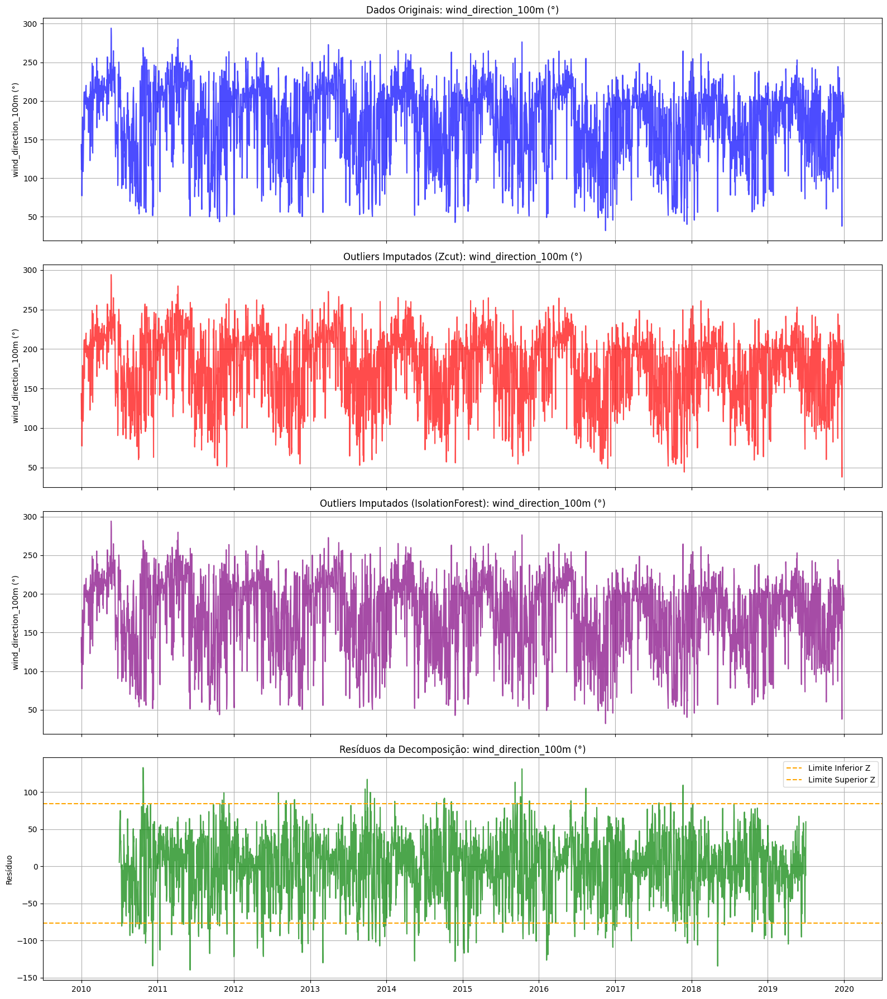

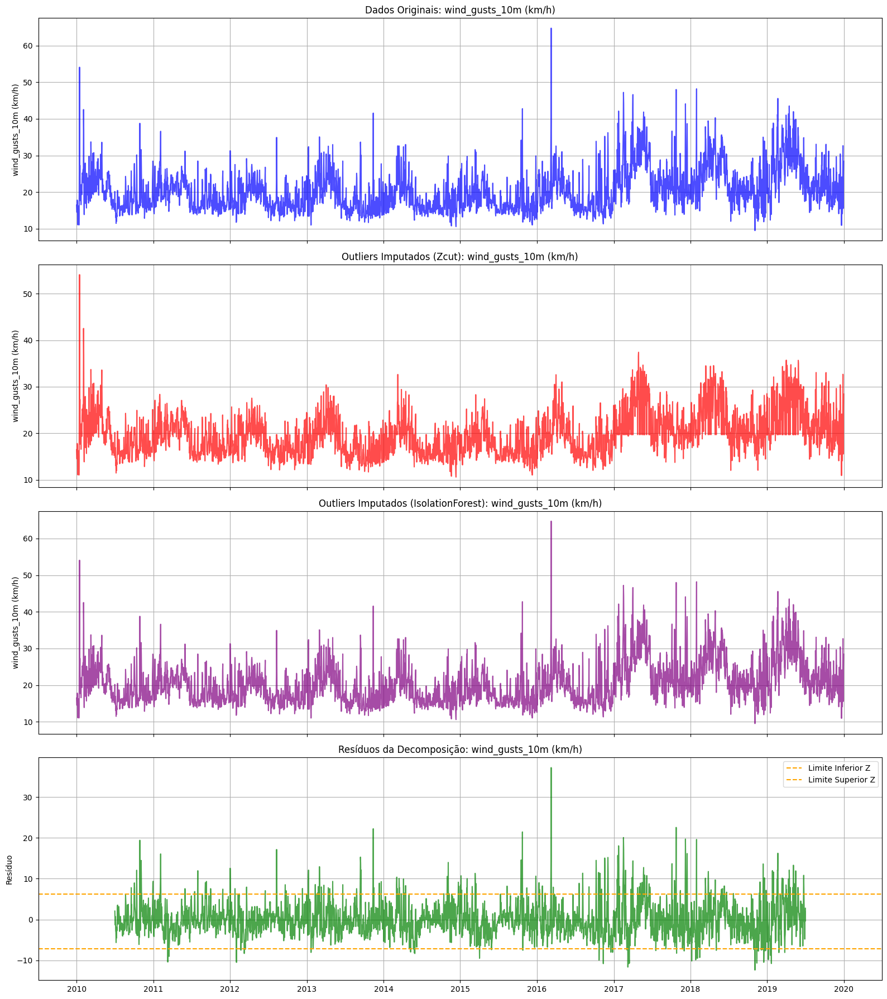

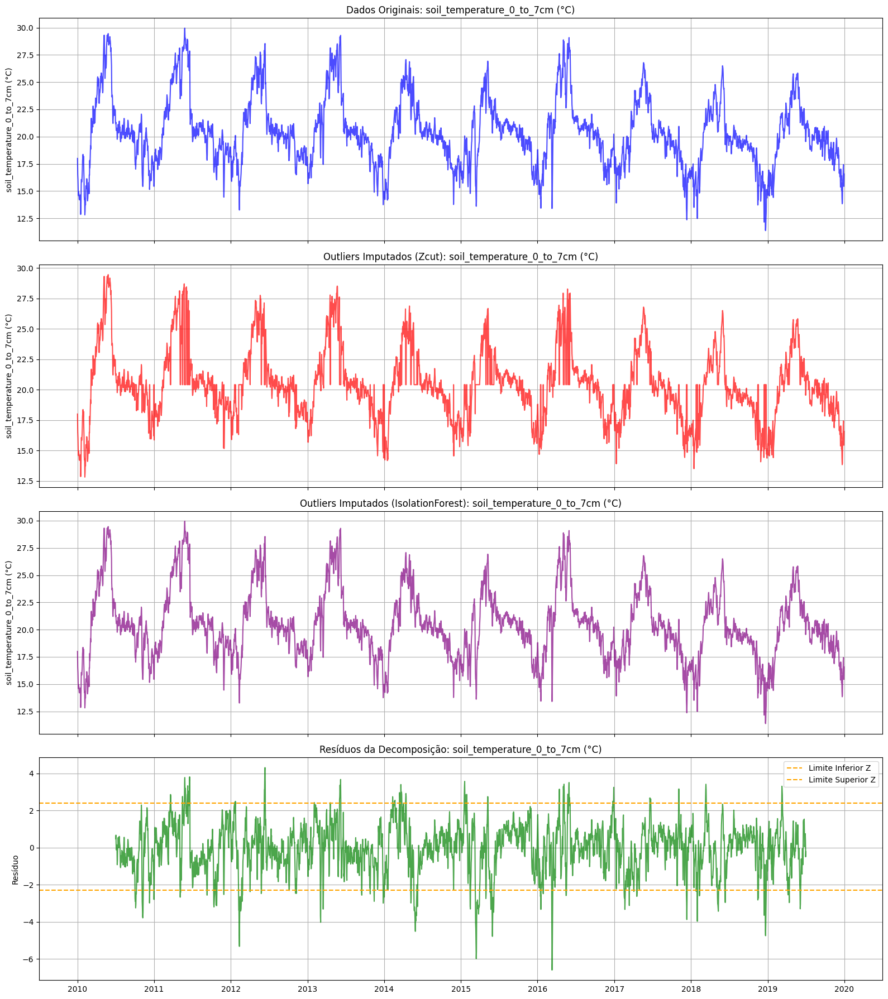

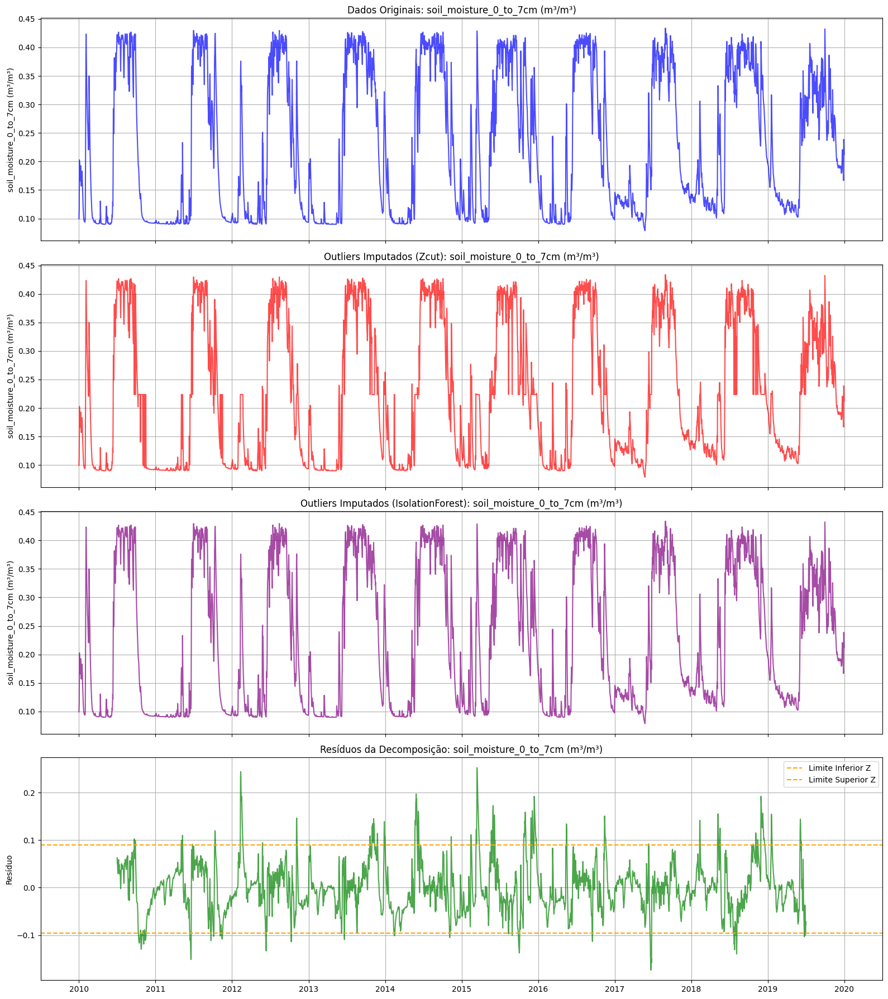

In [169]:
def InputOuliers(plot):
    def ZLimits(data: np.array, index=3): # type: ignore
        mean = np.mean(data)
        std  = np.std(data)
        return mean - index * std, mean + index * std

    def RobutsZlimits(data: np.array, index=3): # type: ignore
        median     = np.median(data)
        mad        = np.median(np.abs(data - median))
        return median - index * mad, median + index * mad    

    def DecomposeWithYearly(col):
        decomposition = seasonal_decompose(col, model='additive', period=365)
        return decomposition

    def IsNomal(data: np.array, alpha=0.05): # type: ignore        
        result = anderson(data)
        return result.statistic < result.critical_values[2] # 5% significance, level 2

    data               = CompareResampling(False)
    outliers_inputed   = deepcopy(data)
    outliers_inputed_f = deepcopy(data)
    for column in data.columns:
        if column == 'time': continue

        col           = data[column]
        is_normal     = IsNomal(col.values)
        decomposition = DecomposeWithYearly(col)
        
        resid_values = decomposition.resid.dropna().values
        
        if is_normal: z_lower, z_upper = ZLimits(resid_values)
        else        : z_lower, z_upper = RobutsZlimits(resid_values)        
        #print(f'Coluna: {column} | Normal: {is_normal} | Limites Z: [{z_lower:.2f}, {z_upper:.2f}]')        
        
        # get the indices of decomposition.resid where outliers are detected
        outliers_indexes = \
        decomposition.resid[(decomposition.resid < z_lower) | (decomposition.resid > z_upper) | (decomposition.resid == np.nan)].index
        outliers_inputed.loc[outliers_indexes, column] = np.nan   
        
        imputer                    = KNNImputer(n_neighbors=2)
        outliers_inputed[column]   = imputer.fit_transform(outliers_inputed[[column]])        
        imputed_decomposition      = DecomposeWithYearly(outliers_inputed[column])  
        
        col_reshape      = decomposition.resid.values.reshape(-1, 1)
        iso              = IsolationForest(contamination=0.1, random_state=42)
        outlier_pred     = iso.fit_predict(col_reshape)
        outliers_mask    = pd.Series(outlier_pred == -1, index=col.index)
        outliers_indexes = outliers_mask[outliers_mask].index        
        outliers_inputed_f.loc[outliers_indexes, column] = np.nan   
        
        imputer                      = KNNImputer(n_neighbors=2)
        outliers_inputed_f[column]   = imputer.fit_transform(outliers_inputed_f[[column]])        
        imputed_decomposition_f      = DecomposeWithYearly(outliers_inputed[column])  
             
        # Plot: uma figura por coluna, 4 subplots verticais
        if plot:
            import matplotlib.pyplot as plt

            fig, axs = plt.subplots(4, 1, figsize=(16, 18), sharex=True)

            # 1. Dados originais (composite)
            axs[0].plot(col.index, col.values, color='blue', alpha=0.7)
            axs[0].set_title(f'Dados Originais: {column}')
            axs[0].set_ylabel(column)
            axs[0].grid(True)

            # 2. Outliers imputados com zcut
            axs[1].plot(outliers_inputed[column].index, outliers_inputed[column].values, color='red', alpha=0.7)
            axs[1].set_title(f'Outliers Imputados (Zcut): {column}')
            axs[1].set_ylabel(column)
            axs[1].grid(True)

            # 3. Outliers imputados com IsolationForest
            axs[2].plot(outliers_inputed_f[column].index, outliers_inputed_f[column].values, color='purple', alpha=0.7)
            axs[2].set_title(f'Outliers Imputados (IsolationForest): {column}')
            axs[2].set_ylabel(column)
            axs[2].grid(True)

            # 4. Resíduos da decomposição original + linhas zcut
            resid = decomposition.resid
            axs[3].plot(resid.index, resid.values, color='green', alpha=0.7)
            axs[3].axhline(z_lower, color='orange', linestyle='--', label='Limite Inferior Z')
            axs[3].axhline(z_upper, color='orange', linestyle='--', label='Limite Superior Z')
            axs[3].set_title(f'Resíduos da Decomposição: {column}')
            axs[3].set_ylabel('Resíduo')
            axs[3].grid(True)
            axs[3].legend()

            plt.tight_layout()
            plt.show()
            
    return outliers_inputed, outliers_inputed_f
        

g_outliers_inputed, g_outliers_inputed_f = InputOuliers(plot=True)

# Seleção de features
* Nessa célula, plotei a matriz de correlação para inspecionar a correlação entre varíáveis
* Fica clara a baixissima correlação entre chuvas e tempratura, de modeo que decidi por dois modelos independentes
* Estabeleçi um corte de correlação absoluta de 0.29, assim definindo dois modelos
  * temperature_2m (°C) com  soil_temperature_0_to_7cm (°C), pressure_msl (hPa) e relative_humidit e
  * rain (mm) com  cloud_cover (%), soil_moisture_0_to_7cm (m³/m³),  e relative_humidity_2m (%)'
* As figuras abaixo da matriz de correlação mostram a series (com o pré-processamento feitos nos passos anteriores) escolhidas para os modelos 

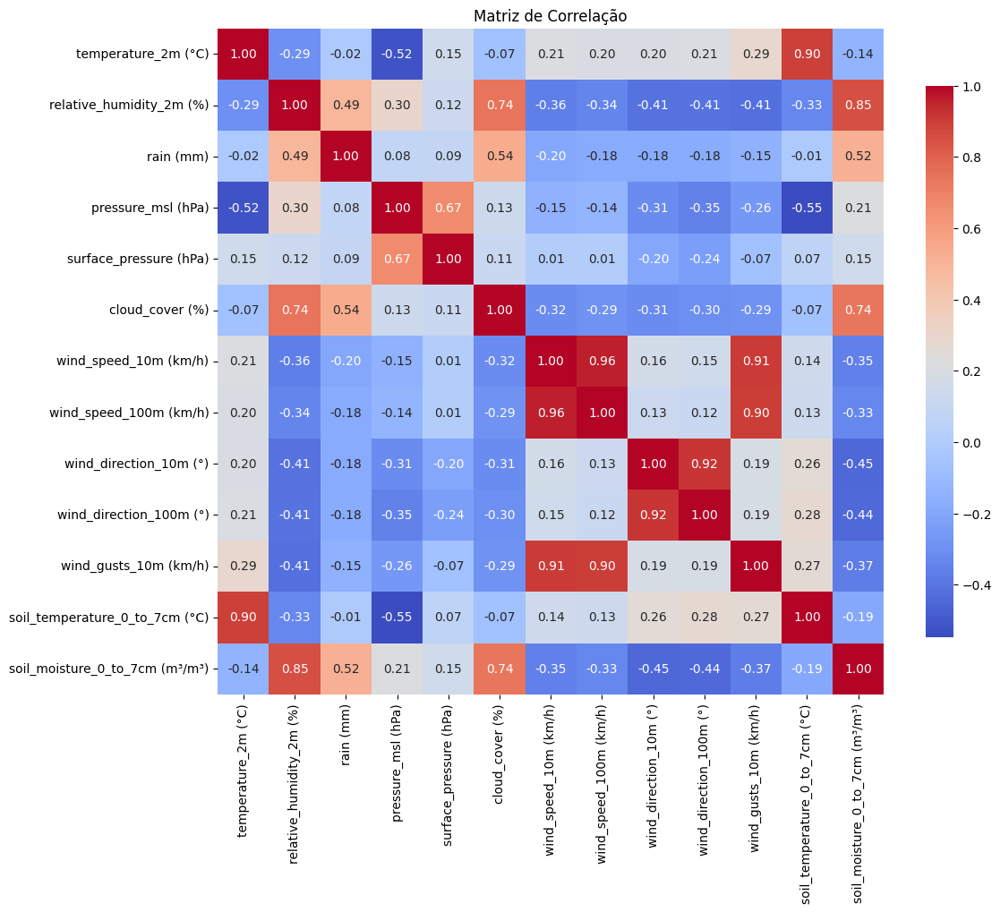

['temperature_2m (°C)', 'soil_temperature_0_to_7cm (°C)', 'pressure_msl (hPa)', 'relative_humidity_2m (%)']
['rain (mm)', 'cloud_cover (%)', 'soil_moisture_0_to_7cm (m³/m³)', 'relative_humidity_2m (%)']


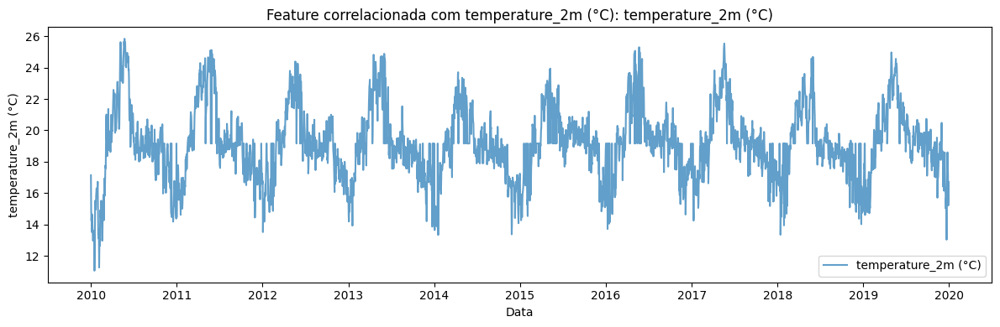

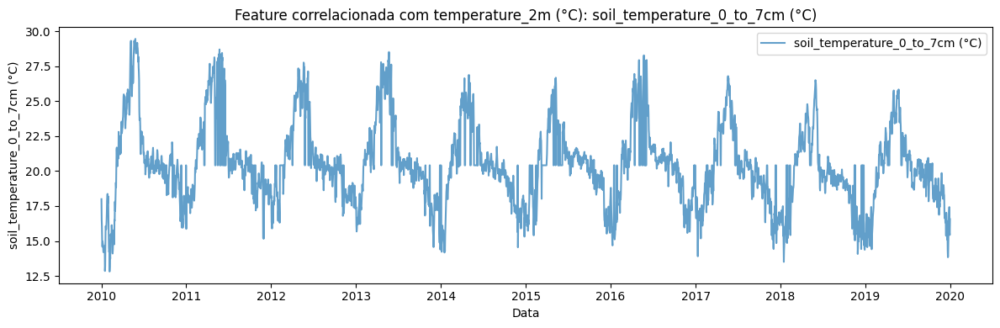

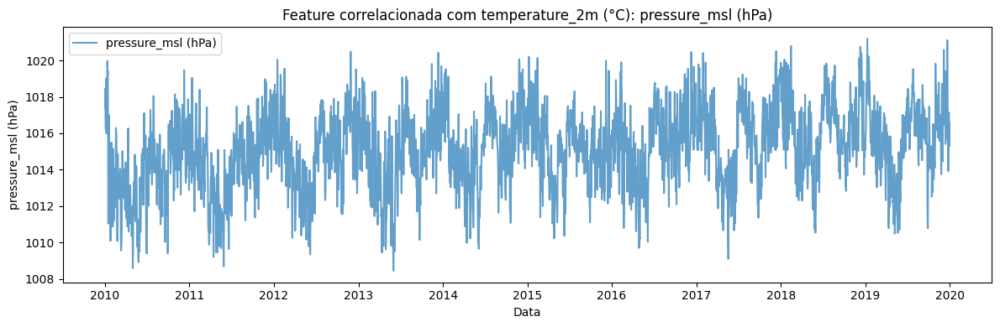

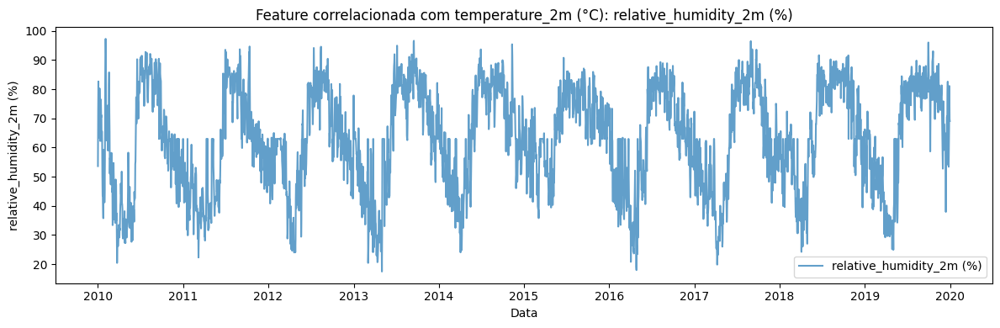

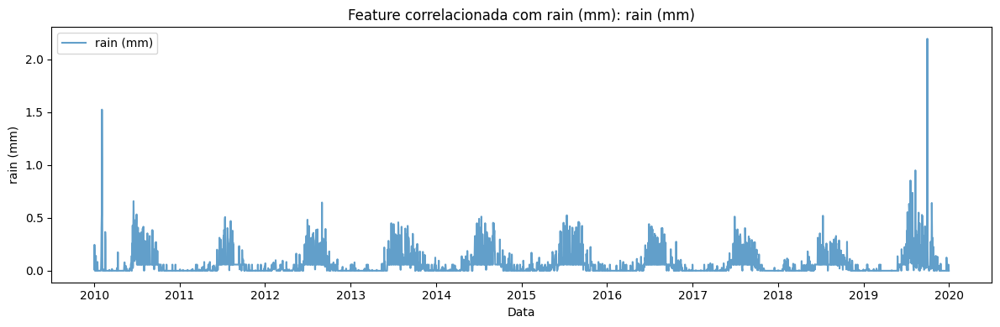

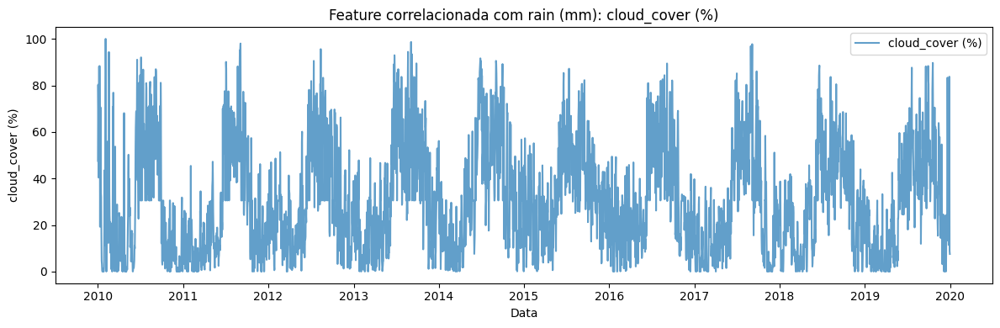

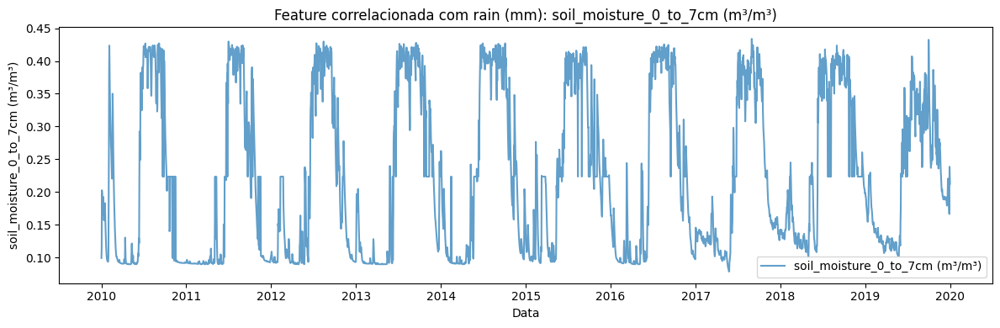

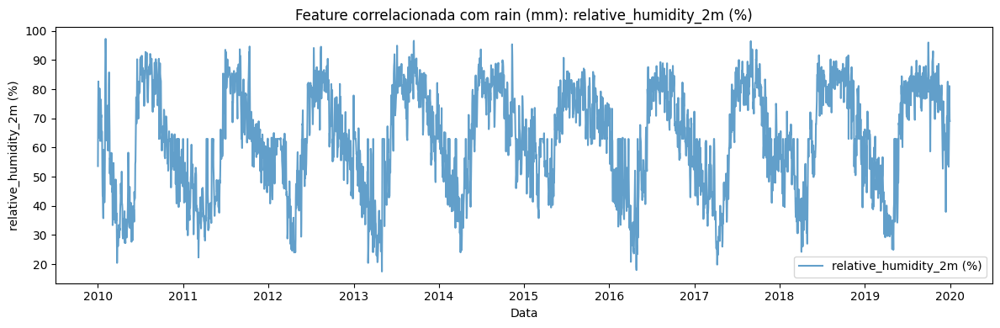

In [174]:
def PlotCorrelationMatrix(data: pd.DataFrame, plot=True):
	corr = data.corr()	

	if plot:
		plt.figure(figsize=(12, 10))
		sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
		plt.title('Matriz de Correlação')
		plt.show()
 
	# print the list of correlations with temperature_2m (°C)
	correlation_with_temp = abs(corr['temperature_2m (°C)']).sort_values(ascending=False)
	#print(f'Correlações com temperature_2m (°C):\n{correlation_with_temp}')
	#print('--------------------------------') 
	correlation_with_rain = abs(corr['rain (mm)']).sort_values(ascending=False)
	#print(f'Correlações com rain (mm):\n{correlation_with_rain}')
 
	## retorna dois novos dataframes, um para temperature_2m (°C) e outro para rain (mm), filtrando apenas as colunas com correlação maior que 0.29
	temp_corr_cols = list(correlation_with_temp[correlation_with_temp > 0.29].index)
	rain_corr_cols = list(correlation_with_rain[correlation_with_rain > 0.29].index)
	if 'time' in data.columns:
		temp_corr_cols = ['time'] + temp_corr_cols
		rain_corr_cols = ['time'] + rain_corr_cols
	temp_corr_df = data[temp_corr_cols]
	rain_corr_df = data[rain_corr_cols]
	return temp_corr_df, rain_corr_df
 
g_temp_corr_df, g_rain_corr_df = PlotCorrelationMatrix(g_outliers_inputed, True)
print(list(g_temp_corr_df.columns))
print(list(g_rain_corr_df.columns))

def plot_selected_features(temp_corr_df, rain_corr_df):	
	for col in temp_corr_df.columns:       
		plt.figure(figsize=(12, 4))
		plt.plot(temp_corr_df.index, temp_corr_df[col], label=col, alpha=0.7)
		plt.title(f'Feature correlacionada com temperature_2m (°C): {col}')
		plt.xlabel('Data')
		plt.ylabel(col)
		plt.legend()
		plt.tight_layout()
		plt.show()

	# Plot para rain (mm)
	for col in rain_corr_df.columns:        
		plt.figure(figsize=(12, 4))
		plt.plot(rain_corr_df.index, rain_corr_df[col], label=col, alpha=0.7)
		plt.title(f'Feature correlacionada com rain (mm): {col}')
		plt.xlabel('Data')
		plt.ylabel(col)
		plt.legend()
		plt.tight_layout()
		plt.show()

plot_selected_features(g_temp_corr_df, g_rain_corr_df)



# Treinamento do modelo Phrophet
* Nessa célula treinei (com dados de 8 anos) e fiz a avaiação (com os dois anos restantes) de 4 modelos Prophet
Dois para cada variável alvo, sendo um com os dados processados e outro com os dados brutos com a reamostragem
* Os hyperparametros dos modelo form ajustados com optimização bayesiana, utilizando o erro medio absoluto como perda
* Fiz validação cruzada com TimeSeriesSplit (scikit-learn) que garante que validação sempre será feita com dados futuros
* As figuras abaixo mostram as predições e as metricas
  * O modelo para temperatura, apresentou bom desmpenho preditivo com erro percentual medio inferior a 6%
  * O modelo com pré-processamente e ligeirmente superior numericamente, mas on intervalo de confiança dexia cclaro que essa diferença não temsignificância estatistica
  * O modelo para precipitção teve desempenho muto mais probre, o que provavelmente se deve a baixa razão sinal/ruido, menor que 1
  * Também no modelo para precipitação, os dados processados tiveram modesta vantagem

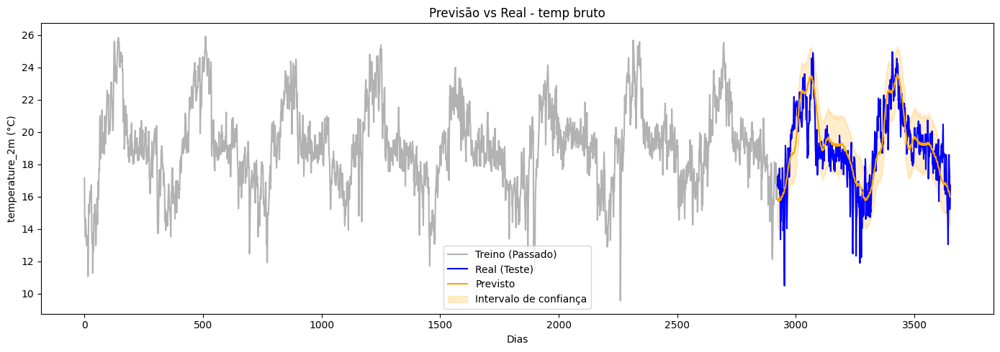

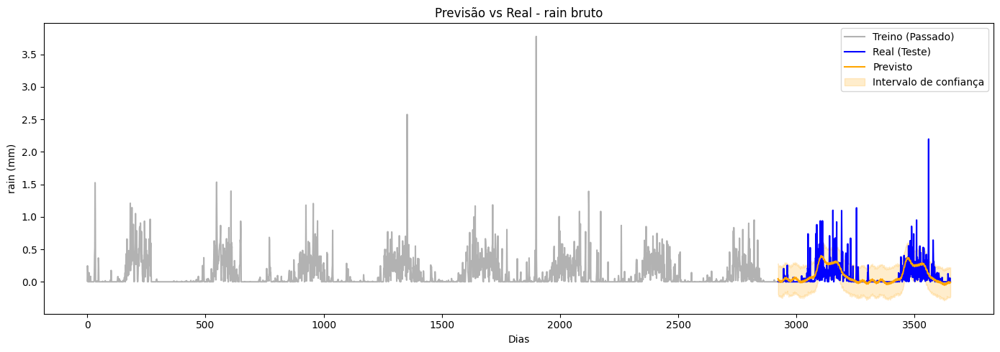

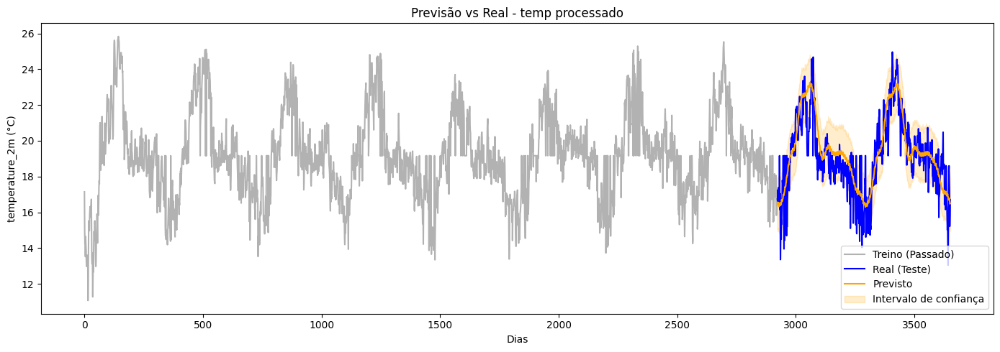

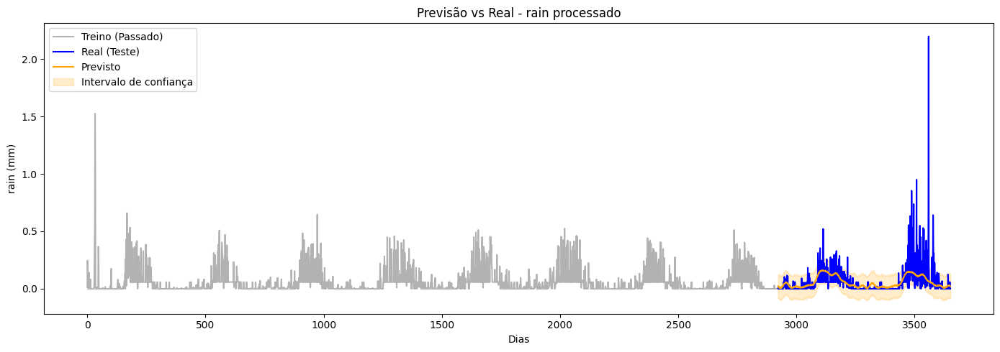

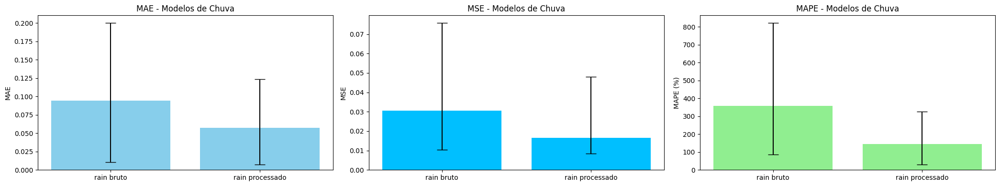

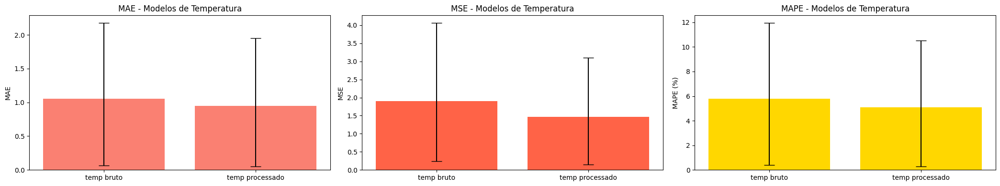

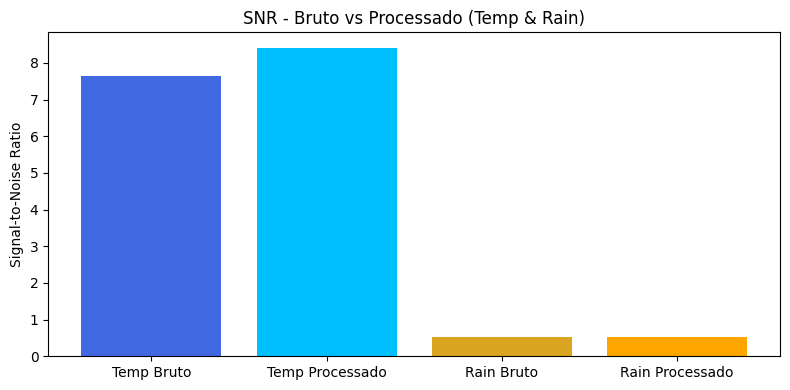

/tmp/ipykernel_13075/4185314512.py:297: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  temp = temp.resample('1H', on='ds').mean().interpolate().reset_index().rename(columns={'ds': 'time', 'yhat': 'temperature_2m (°C)'})
/tmp/ipykernel_13075/4185314512.py:299: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  rain = rain.resample('1H', on='ds').mean().interpolate().reset_index().rename(columns={'ds': 'time', 'yhat': 'rain (mm)'})


Processed data saved to data/processed_data.csv


In [209]:
from prophet.diagnostics import cross_validation
class PhrophetStimator(BaseEstimator, RegressorMixin):
    def __init__(self, seasonality_mode='additive', changepoint_prior_scale=0.05, seasonality_prior_scale=10.0):
        self.seasonality_mode = seasonality_mode
        self.changepoint_prior_scale = changepoint_prior_scale
        self.seasonality_prior_scale = seasonality_prior_scale
        self.results_         = None
        self.model            = None
        self.alvo             = 'temperature_2m (°C)'
        
    def TransformData(self, data):
        df         = data.copy()
        if 'time' not in df.columns: df['time'] = df.index
        df['time'] = pd.to_datetime(df['time'])
        df         = df.set_index('time')
        df_daily   = df.resample('1D').mean().reset_index()
        df_daily   = df_daily.rename(columns={'time': 'ds', self.alvo: 'y'})        
        return df_daily    
    
    def AddRegressors(self, model, df_daily):        
        # torna o modelo efetivamente univariado, inflizmente houve um bug que não consegui corrir a tempo
        return
        for column in df_daily.columns:
            if column not in ['ds', 'y']:
                model.add_regressor(column)
        return model

    def fit(self, X, y):        
        df         = self.TransformData(X)  
        self.model = Prophet(seasonality_mode=self.seasonality_mode, 
                            changepoint_prior_scale=self.changepoint_prior_scale, 
                            seasonality_prior_scale=self.seasonality_prior_scale
                            )
        self.AddRegressors(self.model, df)
        self.model.fit(df)        
        return self
    
    def predict_with_ci(self, X):
        df = self.TransformData(X)     
        for column in df.columns:
            if column not in ['ds']:
                df[column] = np.nan  # garantir que não estamos vazando dados para o modelo        
        df[self.alvo] = np.nan       # garantir que não estamos vazando dados para o modelo            
        preds         = self.model.predict(df)     
        return preds

    def predict(self, X):        
        if self.model is None: raise Exception("predicting before fit.")
        df            = self.TransformData(X)
        for column in df.columns:
            if column not in ['ds']:
                df[column] = np.nan  # garantir que não estamos vazando dados para o modelo        
        df[self.alvo] = np.nan       # garantir que não estamos vazando dados para o modelo                
        preds         = self.model.predict(df)        
        preds.index   = X.index[:len(preds)]
        return preds['yhat']
    
class PhrophetRainStimator(PhrophetStimator):
    def __init__(self, seasonality_mode='additive', changepoint_prior_scale=0.05, seasonality_prior_scale=10.0):
        super().__init__(seasonality_mode, changepoint_prior_scale, seasonality_prior_scale)
        self.alvo = 'rain (mm)'    
    
def FitPhophet(x_data, y, model_type='temp'):    
    param_space = {
        'seasonality_mode' : ['additive', 'multiplicative'], 
        'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    	'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],         
    }  
    
    bayes_search  = BayesSearchCV(
        estimator     = PhrophetStimator() if model_type == 'temp' else PhrophetRainStimator(),
        search_spaces = param_space,
        cv            = TimeSeriesSplit(n_splits=5),
        scoring       = 'neg_mean_absolute_error',
        n_jobs        =	5,
        n_iter        = 1,
        verbose       = 2,
    )

    bayes_search.fit(x_data, y)    
    return bayes_search

def EvaluatePhophet():      
    
    def signal_to_noise_ratio(signal):
        """Calculates the signal-to-noise ratio of a 1D numpy array."""
        mean_signal = np.mean(signal)
        std_signal = np.std(signal)
        if std_signal == 0:  # Avoid division by zero
            return np.inf  # Return infinity if there's no noise
        return mean_signal / std_signal
      
    def GetMetrics(y_true, y_pred, n_bootstrap=1000):
        y_true   = y_true.to_numpy()
        y_pred   = y_pred.to_numpy()
        errors   = abs(y_true - y_pred)
        s_errors = (y_true - y_pred) ** 2

        # Percentual errors (MAPE)
        # Avoid division by zero
        with np.errstate(divide='ignore', invalid='ignore'):
            perc_errors = np.where(y_true != 0, errors / np.abs(y_true), np.nan)
            mape = np.nanmean(perc_errors) * 100

        mae = mean_absolute_error(y_true, y_pred)
        mse = mean_squared_error(y_true, y_pred)

        # Bootstrap confidence intervals
        mae_samples  = []
        mse_samples  = []
        mape_samples = []
        rng = np.random.default_rng(42)
        for _ in range(n_bootstrap):
            idx = rng.integers(0, len(errors), len(errors))
            mae_samples.append(np.mean(errors[idx]))
            mse_samples.append(np.mean(s_errors[idx]))
            mape_samples.append(np.nanmean(perc_errors[idx]) * 100)
        mae_lower,  mae_upper  = np.percentile(mae_samples, [2.5, 97.5])
        mse_lower,  mse_upper  = np.percentile(mse_samples, [2.5, 97.5])
        mape_lower, mape_upper = np.percentile(mape_samples, [2.5, 97.5])

        return {
            'mae': mae,
            'mae_95_lower': mae_lower,
            'mae_95_upper': mae_upper,
            'mse': mse,
            'mse_95_lower': mse_lower,
            'mse_95_upper': mse_upper,
            'mape': mape,
            'mape_95_lower': mape_lower,
            'mape_95_upper': mape_upper
        }
		
    
    bruto           = g_Dados.brutos()
    bruto['time']   = pd.to_datetime(bruto['time'])
    bruto           = bruto.set_index('time').resample('1D').mean().reset_index()
    processado_temp = deepcopy(g_temp_corr_df)
    processado_rain = deepcopy(g_rain_corr_df)
    models          = {
        'temp bruto'      : {'data' : bruto, 'target' : 'temperature_2m (°C)', 'results' : {}},
        'rain bruto'      : {'data' : bruto, 'target' : 'rain (mm)', 'results' : {}},
        'temp processado' : {'data' : processado_temp, 'target' : 'temperature_2m (°C)', 'results' : {}},
        'rain processado' : {'data' : processado_rain, 'target' : 'rain (mm)', 'results' : {}},  
    }
    for model in models:
        print(f'Fitting model: {model}')
        data     = models[model]['data']
        length   = data.shape[0]
        _2years  = 730
        train    = data[0:length - _2years] 
        test     = data[-_2years:]  
        fit      = FitPhophet(train, train[models[model]['target']], model_type='temp' if 'temp' in model else 'rain')        
        forecast = fit.best_estimator_.predict_with_ci(train)
        models[model]['forecast'] = forecast     
    
    clear_output()    
    for model in models:   
        y_true  = models[model]['data'][-_2years:][models[model]['target']]
        y_pred  = models[model]['forecast']['yhat'][-_2years:]
        models[model]['metrics'] = GetMetrics(y_true, y_pred)
        #print(model)
        #print(dumps(models[model]['metrics'], indent=4))
     
    # plot preditions and bar plots comparing metrics    

    for model in models:
        # Get past values (train set)
        train       = models[model]['data'][0:len(models[model]['data']) - _2years][models[model]['target']].to_numpy()
        y_true      = models[model]['data'][-_2years:][models[model]['target']].to_numpy()
        forecast_df = models[model]['forecast'][-_2years:]
        y_pred      = forecast_df['yhat'].to_numpy()

        # Confidence intervals (if available)
        yhat_lower = forecast_df['yhat_lower'].to_numpy() if 'yhat_lower' in forecast_df else None
        yhat_upper = forecast_df['yhat_upper'].to_numpy() if 'yhat_upper' in forecast_df else None

        plt.figure(figsize=(14, 5))
        plt.plot(range(len(train)), train, label='Treino (Passado)', color='gray', alpha=0.6)
        plt.plot(range(len(train), len(train) + len(y_true)), y_true, label='Real (Teste)', color='blue')
        plt.plot(range(len(train), len(train) + len(y_pred)), y_pred, label='Previsto', color='orange')

        # Plot confidence intervals if available
        if yhat_lower is not None and yhat_upper is not None:
            plt.fill_between(
                range(len(train), len(train) + len(y_pred)),
                yhat_lower, yhat_upper,
                color='orange', alpha=0.2, label='Intervalo de confiança'
            )

        plt.title(f'Previsão vs Real - {model}')
        plt.xlabel('Dias')
        plt.ylabel(models[model]['target'])
        plt.legend()
        plt.tight_layout()
        plt.show()
           
 
    # Bar plots: rain (MAE, MSE, MAPE) and temp (MAE, MSE, MAPE) side by side
    temp_models = [m for m in models if 'temp' in m]
    rain_models = [m for m in models if 'rain' in m]

    fig, axs = plt.subplots(1, 3, figsize=(21, 4))
    # Rain MAE
    mae_rain = [models[m]['metrics']['mae'] for m in rain_models]
    mae_rain_lower = [models[m]['metrics']['mae_95_lower'] for m in rain_models]
    mae_rain_upper = [models[m]['metrics']['mae_95_upper'] for m in rain_models]
    axs[0].bar(rain_models, mae_rain, yerr=[mae_rain_lower, mae_rain_upper], capsize=8, color='skyblue')
    axs[0].set_ylabel('MAE')
    axs[0].set_title('MAE - Modelos de Chuva')

    # Rain MSE
    mse_rain = [models[m]['metrics']['mse'] for m in rain_models]
    mse_rain_lower = [models[m]['metrics']['mse_95_lower'] for m in rain_models]
    mse_rain_upper = [models[m]['metrics']['mse_95_upper'] for m in rain_models]
    axs[1].bar(rain_models, mse_rain, yerr=[mse_rain_lower, mse_rain_upper], capsize=8, color='deepskyblue')
    axs[1].set_ylabel('MSE')
    axs[1].set_title('MSE - Modelos de Chuva')

    # Rain MAPE
    mape_rain = [models[m]['metrics']['mape'] for m in rain_models]
    mape_rain_lower = [models[m]['metrics']['mape_95_lower'] for m in rain_models]
    mape_rain_upper = [models[m]['metrics']['mape_95_upper'] for m in rain_models]
    axs[2].bar(rain_models, mape_rain, yerr=[mape_rain_lower, mape_rain_upper], capsize=8, color='lightgreen')
    axs[2].set_ylabel('MAPE (%)')
    axs[2].set_title('MAPE - Modelos de Chuva')

    plt.tight_layout()
    plt.show()

    fig, axs = plt.subplots(1, 3, figsize=(21, 4))
    # Temp MAE
    mae_temp = [models[m]['metrics']['mae'] for m in temp_models]
    mae_temp_lower = [models[m]['metrics']['mae_95_lower'] for m in temp_models]
    mae_temp_upper = [models[m]['metrics']['mae_95_upper'] for m in temp_models]
    axs[0].bar(temp_models, mae_temp, yerr=[mae_temp_lower, mae_temp_upper], capsize=8, color='salmon')
    axs[0].set_ylabel('MAE')
    axs[0].set_title('MAE - Modelos de Temperatura')

    # Temp MSE
    mse_temp = [models[m]['metrics']['mse'] for m in temp_models]
    mse_temp_lower = [models[m]['metrics']['mse_95_lower'] for m in temp_models]
    mse_temp_upper = [models[m]['metrics']['mse_95_upper'] for m in temp_models]
    axs[1].bar(temp_models, mse_temp, yerr=[mse_temp_lower, mse_temp_upper], capsize=8, color='tomato')
    axs[1].set_ylabel('MSE')
    axs[1].set_title('MSE - Modelos de Temperatura')

    # Temp MAPE
    mape_temp = [models[m]['metrics']['mape'] for m in temp_models]
    mape_temp_lower = [models[m]['metrics']['mape_95_lower'] for m in temp_models]
    mape_temp_upper = [models[m]['metrics']['mape_95_upper'] for m in temp_models]
    axs[2].bar(temp_models, mape_temp, yerr=[mape_temp_lower, mape_temp_upper], capsize=8, color='gold')
    axs[2].set_ylabel('MAPE (%)')
    axs[2].set_title('MAPE - Modelos de Temperatura')

    plt.tight_layout()
    plt.show()       


    # Bar plots: rain (MAE, MSE, MAPE) and temp (MAE, MSE, MAPE) side by side
    temp_models = [m for m in models if 'temp' in m]
    rain_models = [m for m in models if 'rain' in m]

    # Signal-to-noise ratio (SNR) bar plot for original and processed data
    snr_labels = ['Temp Bruto', 'Temp Processado', 'Rain Bruto', 'Rain Processado']
    snr_values = []

    # Temp Bruto
    temp_bruto = models['temp bruto']['data']['temperature_2m (°C)'].dropna().to_numpy()
    snr_temp_bruto = signal_to_noise_ratio(temp_bruto)
    snr_values.append(snr_temp_bruto)

    # Temp Processado
    temp_proc = models['temp processado']['data']['temperature_2m (°C)'].dropna().to_numpy()
    snr_temp_proc = signal_to_noise_ratio(temp_proc)
    snr_values.append(snr_temp_proc)

    # Rain Bruto
    rain_bruto = models['rain bruto']['data']['rain (mm)'].dropna().to_numpy()
    snr_rain_bruto = signal_to_noise_ratio(rain_bruto)
    snr_values.append(snr_rain_bruto)

    # Rain Processado
    rain_proc = models['rain processado']['data']['rain (mm)'].dropna().to_numpy()
    snr_rain_proc = signal_to_noise_ratio(rain_proc)
    snr_values.append(snr_rain_proc)

    plt.figure(figsize=(8, 4))
    plt.bar(snr_labels, snr_values, color=['royalblue', 'deepskyblue', 'goldenrod', 'orange'])
    plt.ylabel('Signal-to-Noise Ratio')
    plt.title('SNR - Bruto vs Processado (Temp & Rain)')
    plt.tight_layout()
    plt.show()
    
    # salvar un dataset com o utimo ano com colunas: time, temperature and rain, updasmpled to hourlly frequency
    temp = models['temp processado']['forecast'][['ds', 'yhat']]
    temp = temp.resample('1H', on='ds').mean().interpolate().reset_index().rename(columns={'ds': 'time', 'yhat': 'temperature_2m (°C)'})
    rain = models['rain processado']['forecast'][['ds', 'yhat']]
    rain = rain.resample('1H', on='ds').mean().interpolate().reset_index().rename(columns={'ds': 'time', 'yhat': 'rain (mm)'})
    temp['rain'] = rain['rain (mm)']
    temp.to_csv('data/processed_data.csv', index=False)
    print('Processed data saved to data/processed_data.csv')
    
EvaluatePhophet()  

In [210]:
from sklearn.model_selection import BaseCrossValidator

class RollingWindowCV(BaseCrossValidator):
    def __init__(self, n_splits):
        self.train_size = 365
        self.tval_size = 365

    def split(self, X, y=None, groups=None):
        n_samples = X.shape[0]
        for index, start in enumerate(range(int(n_samples / (self.train_size + self.tval_size)))):
            train_indices = range(start, start + self.train_size)
            test_indices = range(start + self.train_size, start + self.train_size + self.tval_size)
            yield train_indices, test_indices

    def get_n_splits(self, X=None, y=None, groups=None):
        n_samples = X.shape[0]
        return int(n_samples / (self.train_size + self.tval_size))


class Sarimaxextimator(BaseEstimator, RegressorMixin):
    def __init__(self, p=1, d=0, q=0, P=0, D=0, Q=0):
        #print(f'Inicializando Sarimaxextimator com parâmetros: p={p}, d={d}, q={q}, P={P}, D={D}, Q={Q}')
        self.p        = p
        self.d        = d
        self.q        = q
        self.P        = P
        self.D        = D
        self.Q        = Q
        self.model_   = None
        self.results_ = None

    def fit(self, X, y):           
        print('fiting with parameters:', self.p, self.d, self.q, self.P, self.D, self.Q)
        order          = (int(self.p), int(self.d), int(self.q))    
        seasonal_order = (int(self.P), int(self.D), int(self.Q), 365)  
        
        y_               = y.reset_index(drop=True)
        X_               = X.reset_index(drop=True)
        self.model_      = SARIMAX(endog=y_, exog=X_, order=order, seasonal_order=seasonal_order, force_stationary=False, enforce_invertibility=False)
        self.results_    = self.model_.fit(disp=False)
        self._pred_index = y.index  # Save original index for output
        return self

    def predict(self, X):
        # Predict using integer index, then restore original index
        X_          = X.reset_index(drop=True)
        preds       = self.results_.predict(start=0, end=len(X_)-1, exog=X_)
        preds.index = X.index  # Restore original index
        return preds

def Sarimax(data_set, x_train, y_train):
    '''SARIMAX com otimização bayesiana e validação cruzada'''
    from skopt.space import Integer
    
    param_space = {
        'p' : Integer(0, 3), 
        'd' : Integer(0, 1),
        'q' : Integer(0, 3),             
    }  
    
    comb = 0
    for param in param_space.values():        
        comb += param.high - param.low + 1
    
    print(f'Número de combinações possíveis: {comb}')
    #return

    bayes_search  = BayesSearchCV(
        estimator     = Sarimaxextimator(),
        search_spaces = param_space,
        cv            = TimeSeriesSplit(n_splits=2),
        scoring       = 'neg_mean_absolute_error',
        n_jobs        =	5,
        n_iter        = 1,
        verbose       = 2,
    )

    bayes_search.fit(x_train, y_train)
    return bayes_search

# Exemplo de uso corrigido:
y = g_outliers_inputed['temperature_2m (°C)']
X = g_outliers_inputed.drop('temperature_2m (°C)', axis=1)
g_bayes_search = Sarimax(g_outliers_inputed, X, y)

Número de combinações possíveis: 10
Fitting 2 folds for each of 1 candidates, totalling 2 fits
fiting with parameters: 3 0 0 0 0 0
fiting with parameters: 3 0 0 0 0 0


/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['force_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['force_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


[CV] END ......................................d=0, p=3, q=0; total time=   1.5s
[CV] END ......................................d=0, p=3, q=0; total time=   3.2s
fiting with parameters: 3 0 0 0 0 0


/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['force_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


In [211]:
class AutoFormerDataLoader:
    # pontos    = 523
    # teste     = 104
    # validação = 104
    # treino    = 315
    
    # definições de janelas
    # amostras teste = 315 - 56 = 259,  batch size = 32, usa 256 amostras
    # teste ou validação 104 - 56 = 48, batch size = 24, usa 48 amostras
    
    
	PAST_COUNT   = 52  # 1 ano
	FUTURE_COUNT = 4   # 1 mes

	def __init__(self):
		from copy import deepcopy
		self.train_samples  = []
		self.test_samples   = []
		self.val_samples    = []
		self.__data         = deepcopy(g_temp_corr_df).resample('1W').mean()
		self.__data['time'] = pd.to_datetime(self.__data.index)
		self.__data = self.__data.rename(columns={'temperature_2m (°C)': 'temp'})
		dates       = self.__data['time']
		month       = [date.month for date in dates]
		self.month  = [(m - 1) / 11 - 0.5 for m in month]  # Normalize to [-0.5, 0.5]	
  
		self.train_cut = self.__data.iloc[0:self.__data.shape[0] - 208]
		self.test_cut  = self.__data.iloc[-104:]
		self.val_cut   = self.__data.iloc[-208 : -104]	
		self.SplitSamples()
	

	def SplitSamples(self):
		self.train_samples = []
		sample_count = self.train_cut.shape[0] - AutoFormerDataLoader.PAST_COUNT - AutoFormerDataLoader.FUTURE_COUNT 
		values       = self.__data['temp'].values
		p_count      = AutoFormerDataLoader.PAST_COUNT
		f_count      = AutoFormerDataLoader.FUTURE_COUNT
		print('train', sample_count)
		for i in range(sample_count):
			self.train_samples.append({
				'past_values'   : values[i : i + p_count],
				'future_values' : values[i + p_count : i + p_count + f_count],
				'past_month'    : self.month[i : i + p_count],
				'future_month'  : self.month[i + p_count : i + p_count + f_count]
			})
   
		self.val_samples = []
		sample_count = self.val_cut.shape[0] - AutoFormerDataLoader.PAST_COUNT - AutoFormerDataLoader.FUTURE_COUNT 
		values       = self.val_cut['temp'].values
		p_count      = AutoFormerDataLoader.PAST_COUNT
		f_count      = AutoFormerDataLoader.FUTURE_COUNT
		print('val', sample_count)
		for i in range(sample_count):
			self.val_samples.append({
				'past_values'   : values[i : i + p_count],
				'future_values' : values[i + p_count : i + p_count + f_count],
				'past_month'    : self.month[i + self.train_cut.shape[0] : i + self.train_cut.shape[0] + p_count],
				'future_month'  : self.month[i + self.train_cut.shape[0] + p_count : i + self.train_cut.shape[0] + p_count + f_count]
			})
   
		self.test_samples = []
		sample_count = self.test_cut.shape[0] - AutoFormerDataLoader.PAST_COUNT - AutoFormerDataLoader.FUTURE_COUNT 
		values       = self.test_cut['temp'].values
		p_count      = AutoFormerDataLoader.PAST_COUNT
		f_count      = AutoFormerDataLoader.FUTURE_COUNT
		print('test', sample_count)
		for i in range(sample_count):	
			self.test_samples.append({
				'past_values'   : values[i : i + p_count],
				'future_values' : values[i + p_count : i + p_count + f_count],
				'past_month'    : self.month[i + self.train_cut.shape[0] + self.val_cut.shape[0] : i + self.train_cut.shape[0] + self.val_cut.shape[0] + p_count],
				'future_month'  : self.month[i + self.train_cut.shape[0] + self.val_cut.shape[0] + p_count : i + self.train_cut.shape[0] + self.val_cut.shape[0] + p_count + f_count]
			})		
  
		for samples in [self.train_samples, self.val_samples, self.test_samples]:
			for sample in samples:
				assert len(sample['past_values'])   == AutoFormerDataLoader.PAST_COUNT
				assert len(sample['future_values']) == AutoFormerDataLoader.FUTURE_COUNT
				assert len(sample['past_month'])    == AutoFormerDataLoader.PAST_COUNT
				assert len(sample['future_month'])  == AutoFormerDataLoader.FUTURE_COUNT
    
	
		def GetTrainBatches(self):
			batches = [self.train_samples[i:i + 32] for i in range(0, 256, 32)]
			return batches

		def GetValBatches(self):
			batches = [self.val_samples[i:i + 24] for i in range(0, 48, 24)]
			return batches		

s = AutoFormerDataLoader()

train 259
val 48
test 48


In [212]:
y = g_outliers_inputed['temperature_2m (°C)']
X = g_outliers_inputed.drop('temperature_2m (°C)', axis=1)
g_bayes_search = Sarimax(g_outliers_inputed, X, y)

Número de combinações possíveis: 10
Fitting 2 folds for each of 1 candidates, totalling 2 fits
fiting with parameters: 1 0 2 0 0 0
fiting with parameters: 1 0 2 0 0 0


/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['force_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['force_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


[CV] END ......................................d=0, p=1, q=2; total time=   0.7s
[CV] END ......................................d=0, p=1, q=2; total time=   1.3s
fiting with parameters: 1 0 2 0 0 0


/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['force_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


/tmp/ipykernel_13075/2288479851.py:13: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  daily_series = df[column].resample('1H').mean().dropna()


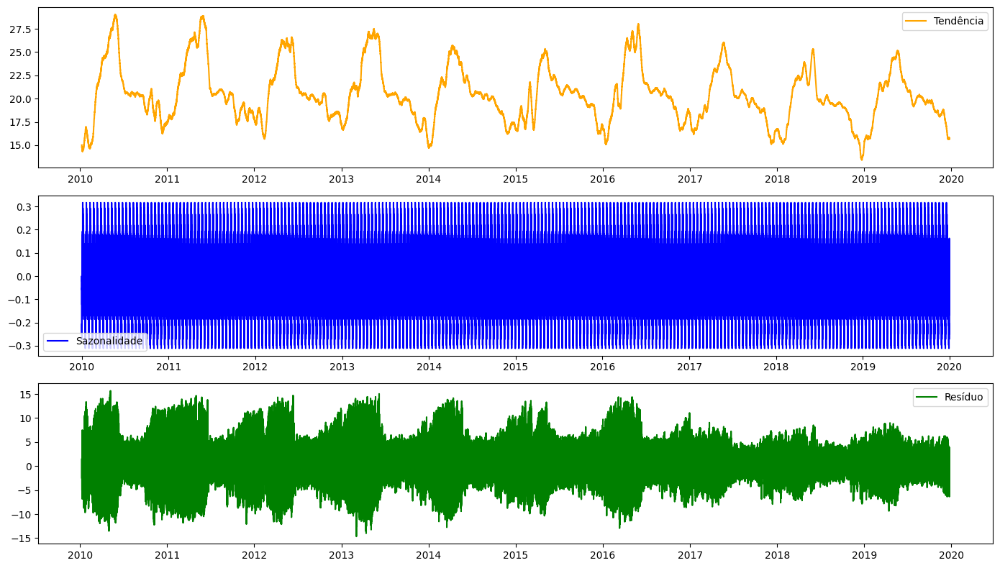

In [213]:
# Decomposição de soil_temperature_0_to_7cm usando ARIMA e statsmodels
import matplotlib.pyplot as plt
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose

# Seleciona e prepara os dados
df = g_Dados.brutos()
df['time'] = pd.to_datetime(df['time'])
column = 'soil_temperature_0_to_7cm (°C)'  # ajuste conforme o nome correto da coluna

# Resample para 1 dia
df = df.set_index('time')
daily_series = df[column].resample('1H').mean().dropna()

# Decomposição usando seasonal_decompose (aditiva)
result = seasonal_decompose(daily_series, model='additive', period=365)

plt.figure(figsize=(14, 8))
plt.subplot(311)
plt.plot(result.trend, label='Tendência', color='orange')
plt.legend()
plt.subplot(312)
plt.plot(result.seasonal, label='Sazonalidade', color='blue')
plt.legend()
plt.subplot(313)
plt.plot(result.resid, label='Resíduo', color='green')
plt.legend()
plt.tight_layout()
plt.show()

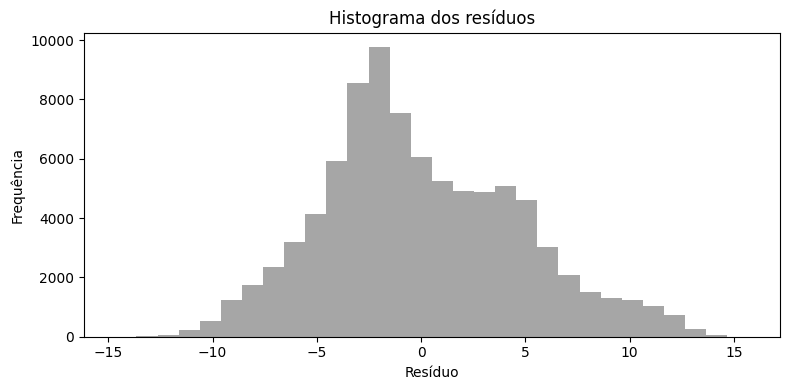

Shapiro-Wilk: stat=0.9865, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=2018.3383, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=405.8872
Critérios:
  15.0%: 0.5760
  10.0%: 0.6560
  5.0%: 0.7870
  2.5%: 0.9180
  1.0%: 1.0920
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)


/home/gotardo/Code/Portifolio/Time-series-meteorological-data/venv/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 87284.
  res = hypotest_fun_out(*samples, **kwds)


In [214]:
# Checar normalidade dos resíduos da decomposição ARIMA/statsmodels
from scipy.stats import shapiro, normaltest, anderson
import matplotlib.pyplot as plt

# Usando o resultado da decomposição já feita acima
residuals = result.resid.dropna()

# Histograma
plt.figure(figsize=(8,4))
plt.hist(residuals, bins=30, color='gray', alpha=0.7)
plt.title('Histograma dos resíduos')
plt.xlabel('Resíduo')
plt.ylabel('Frequência')
plt.tight_layout()
plt.show()

# Teste de Shapiro-Wilk
shapiro_stat, shapiro_p = shapiro(residuals)
print(f'Shapiro-Wilk: stat={shapiro_stat:.4f}, p={shapiro_p:.4f}')
if shapiro_p < 0.05:
    print("Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)")
else:
    print("Não rejeita H0: Os resíduos PODEM ser normalmente distribuídos (Shapiro-Wilk)")

# Teste de D’Agostino e Pearson
dagostino_stat, dagostino_p = normaltest(residuals)
print(f'D\'Agostino-Pearson: stat={dagostino_stat:.4f}, p={dagostino_p:.4f}')
if dagostino_p < 0.05:
    print("Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)")
else:
    print("Não rejeita H0: Os resíduos PODEM ser normalmente distribuídos (D'Agostino-Pearson)")

# Teste de Anderson-Darling
anderson_result = anderson(residuals)
print(f'Anderson-Darling: stat={anderson_result.statistic:.4f}')
print('Critérios:')
for i, (cv, sig) in enumerate(zip(anderson_result.critical_values, anderson_result.significance_level)):
    print(f'  {sig}%: {cv:.4f}')
if anderson_result.statistic > anderson_result.critical_values[2]:  # 5% nível de significância
    print("Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)")
else:
    print("Não rejeita H0: Os resíduos PODEM ser normalmente distribuídos (Anderson-Darling, 5%)")


--- temperature_2m (°C) ---


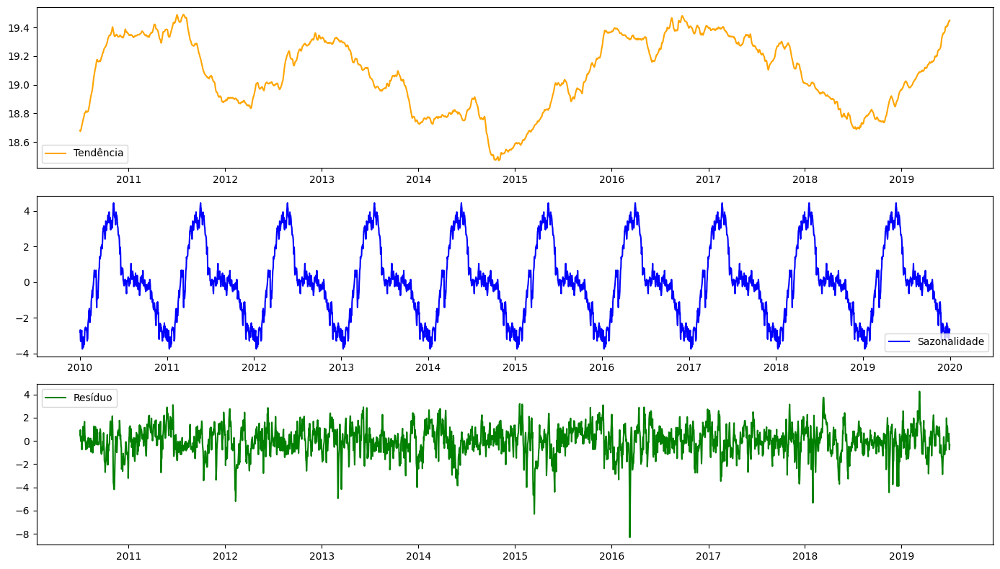

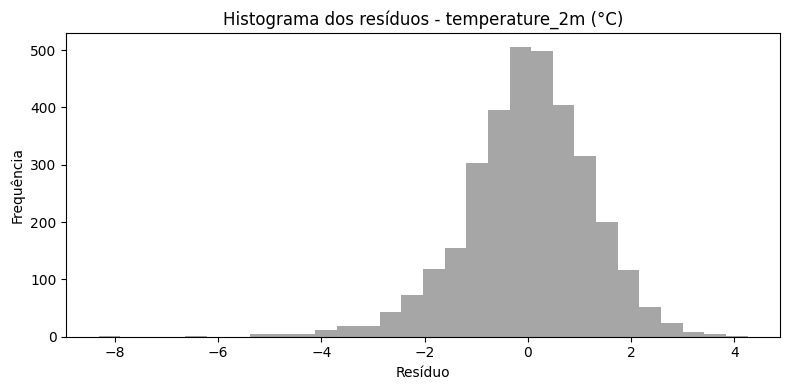

Shapiro-Wilk: stat=0.9784, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=322.9624, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=10.8137
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- relative_humidity_2m (%) ---


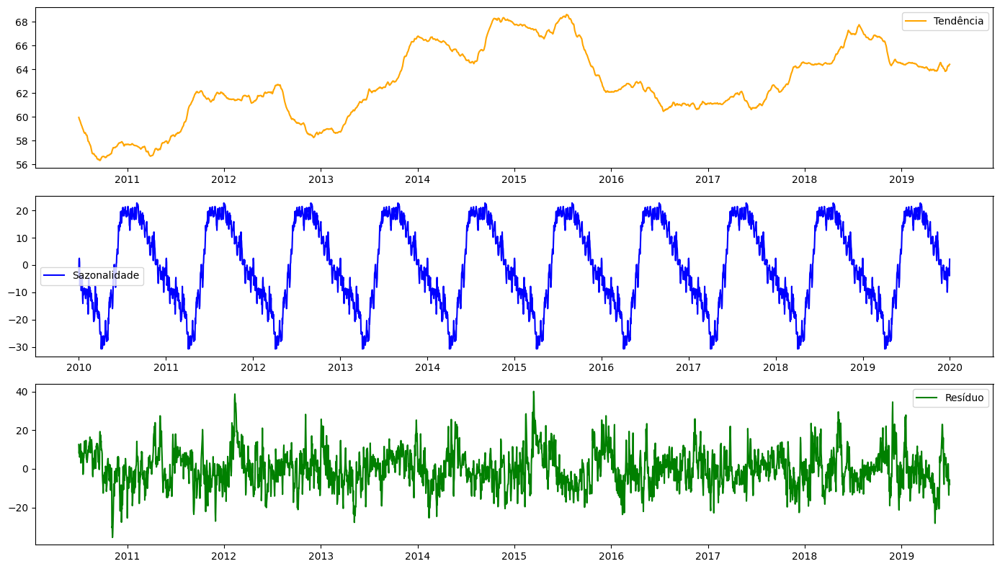

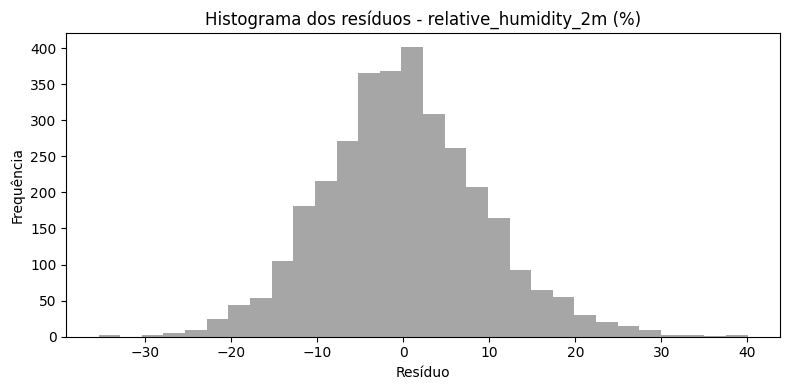

Shapiro-Wilk: stat=0.9945, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=62.0143, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=4.0368
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- rain (mm) ---


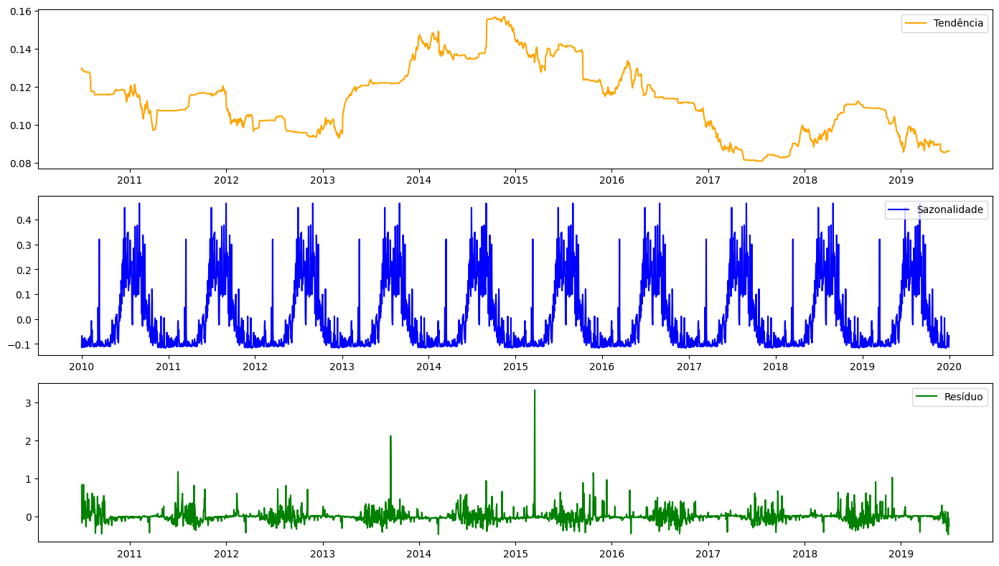

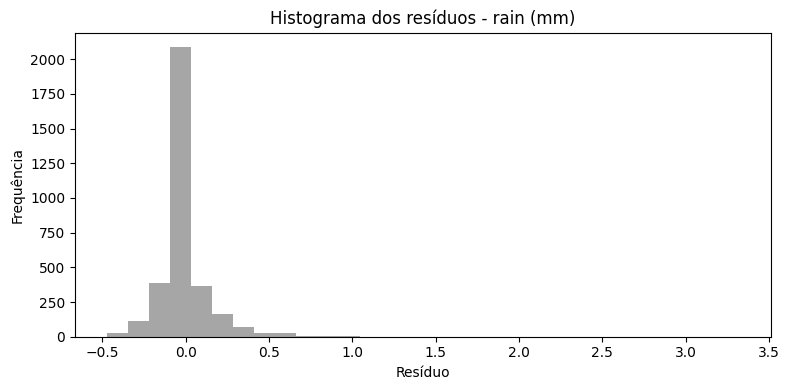

Shapiro-Wilk: stat=0.7211, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=3376.3467, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=209.6116
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- pressure_msl (hPa) ---


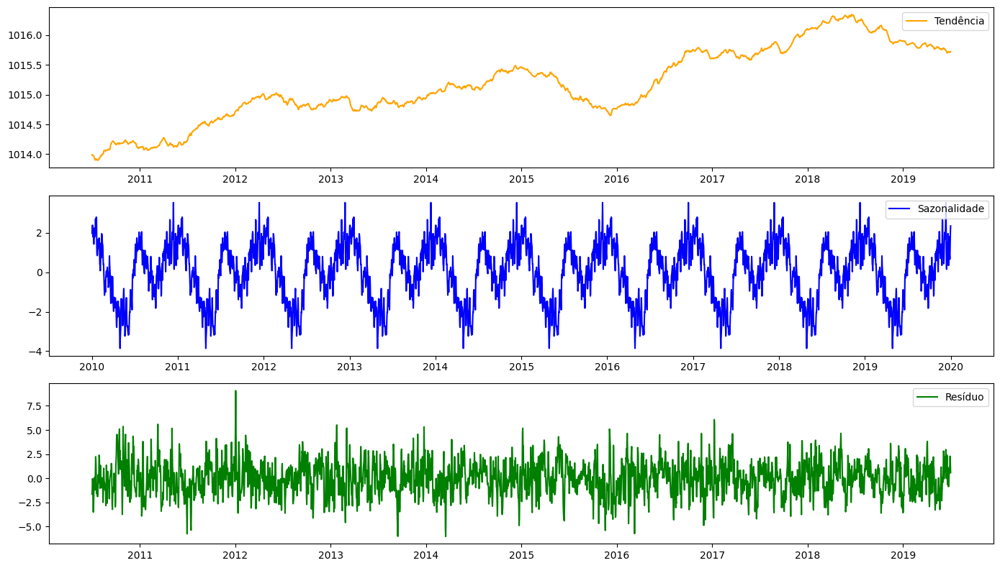

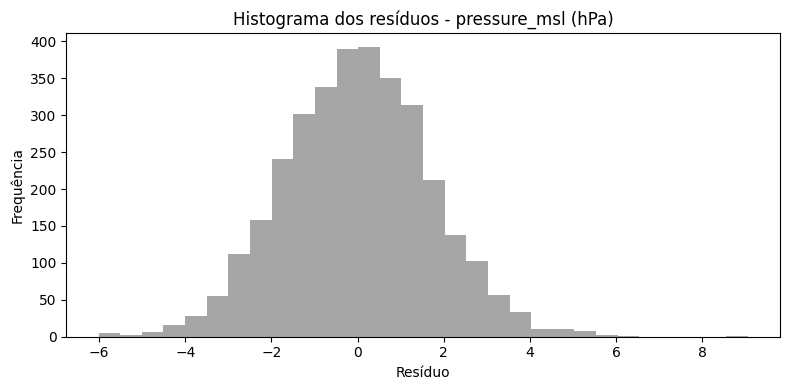

Shapiro-Wilk: stat=0.9981, p=0.0006
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=19.3826, p=0.0001
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=0.5575
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Não rejeita H0: Os resíduos PODEM ser normalmente distribuídos (Anderson-Darling, 5%)

--- surface_pressure (hPa) ---


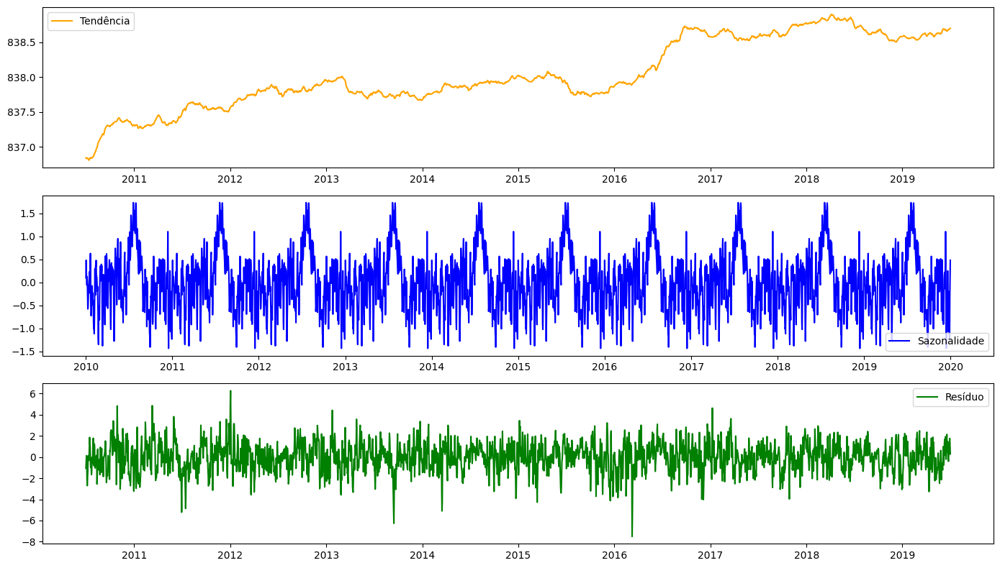

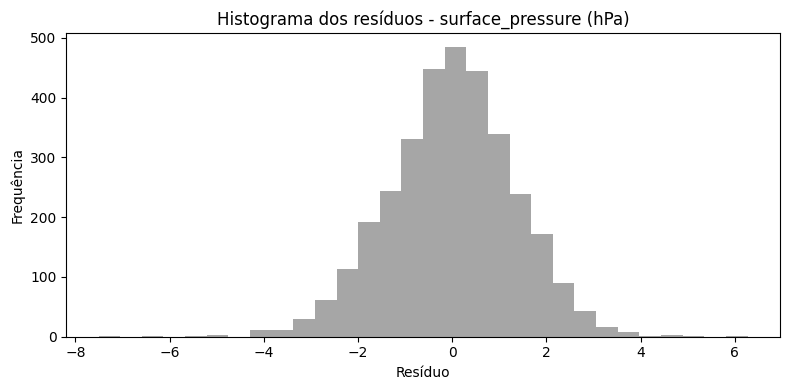

Shapiro-Wilk: stat=0.9948, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=65.8223, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=2.2335
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- cloud_cover (%) ---


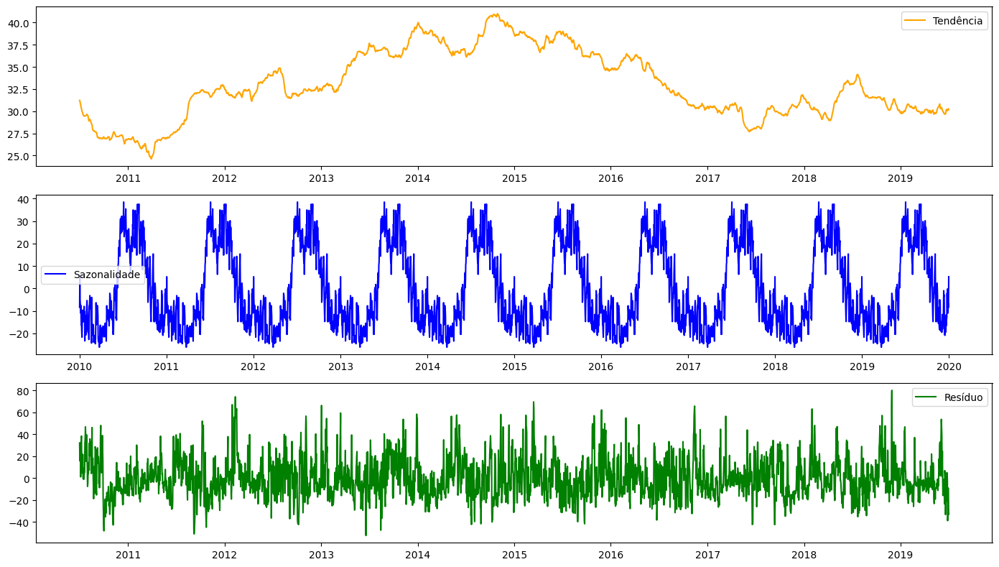

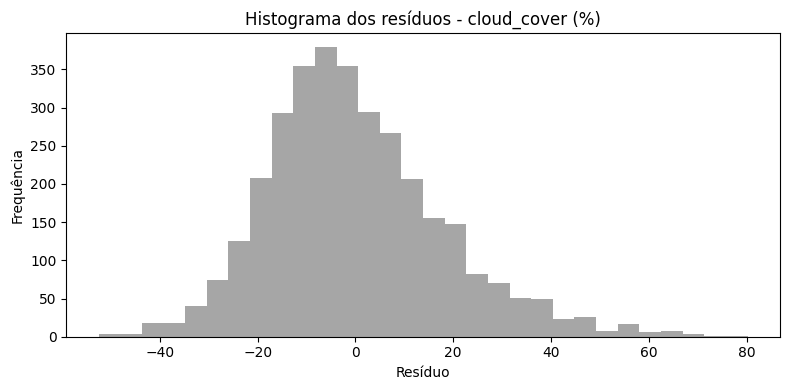

Shapiro-Wilk: stat=0.9739, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=265.7137, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=22.8075
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- wind_speed_10m (km/h) ---


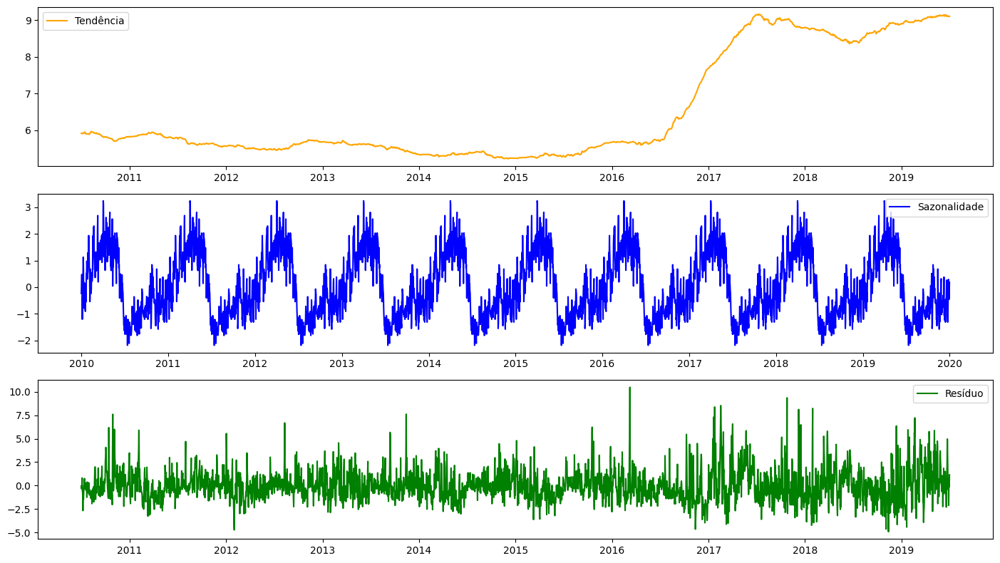

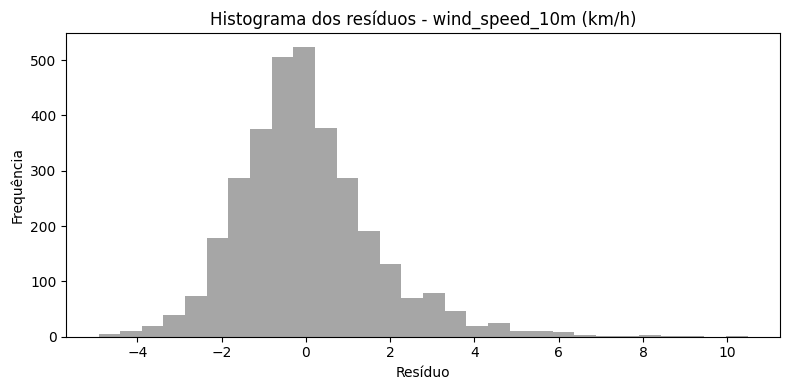

Shapiro-Wilk: stat=0.9531, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=592.7615, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=32.3158
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- wind_speed_100m (km/h) ---


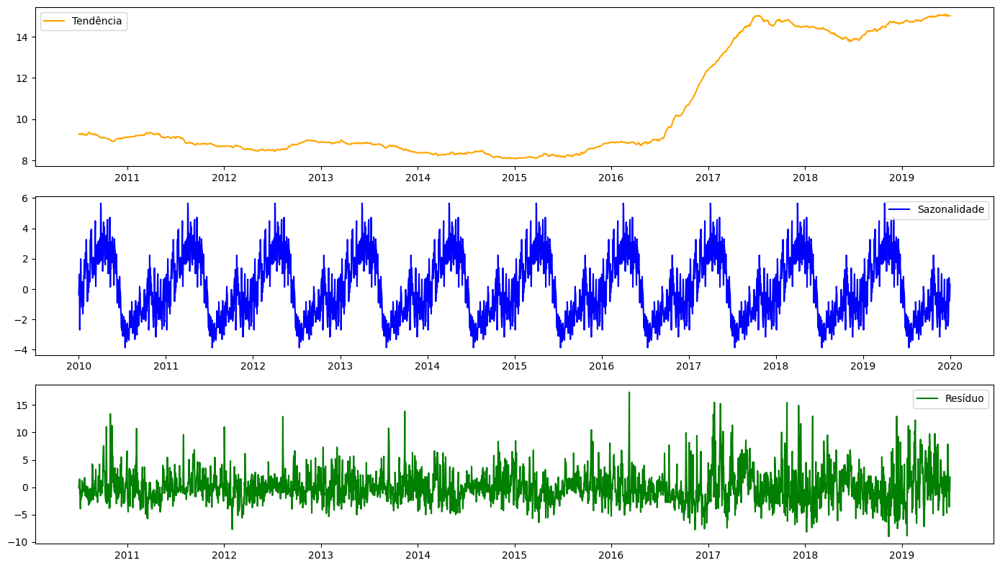

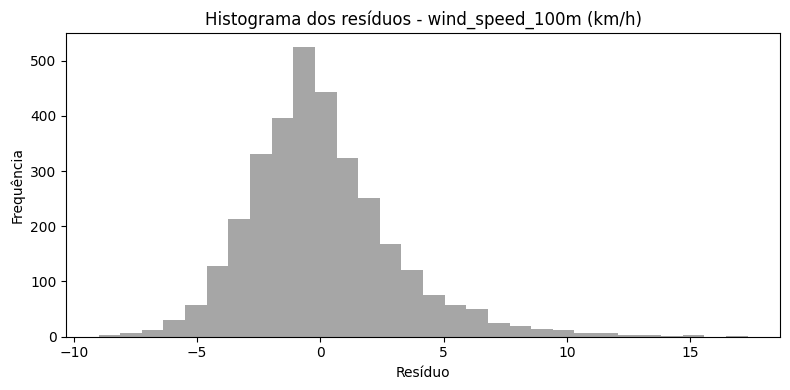

Shapiro-Wilk: stat=0.9535, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=573.9446, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=31.9579
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- wind_direction_10m (°) ---


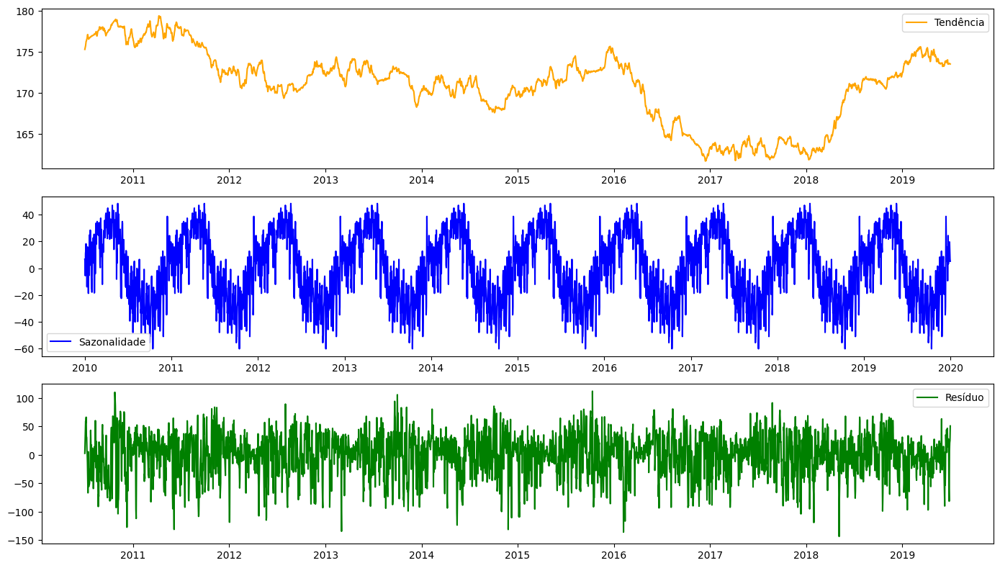

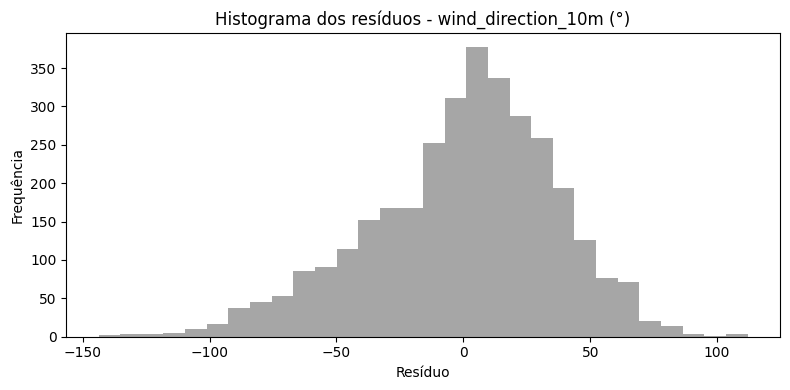

Shapiro-Wilk: stat=0.9830, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=135.4424, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=17.8891
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- wind_direction_100m (°) ---


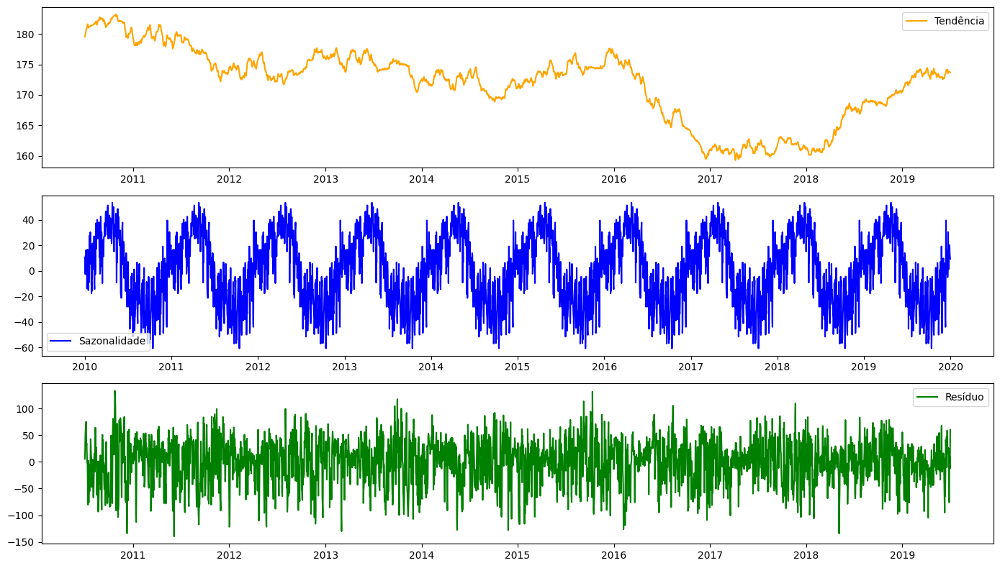

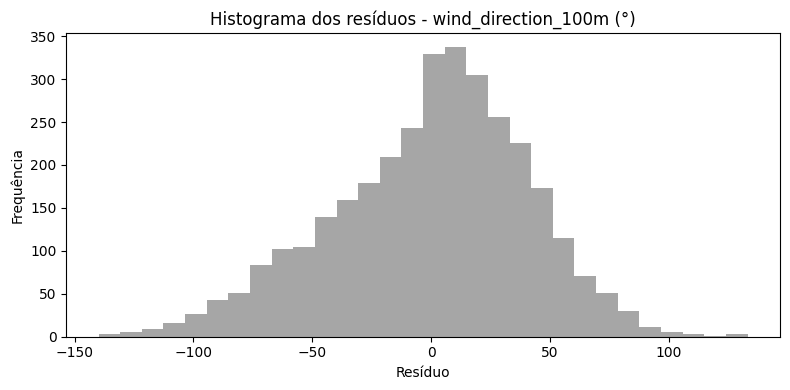

Shapiro-Wilk: stat=0.9888, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=70.8036, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=13.0936
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- wind_gusts_10m (km/h) ---


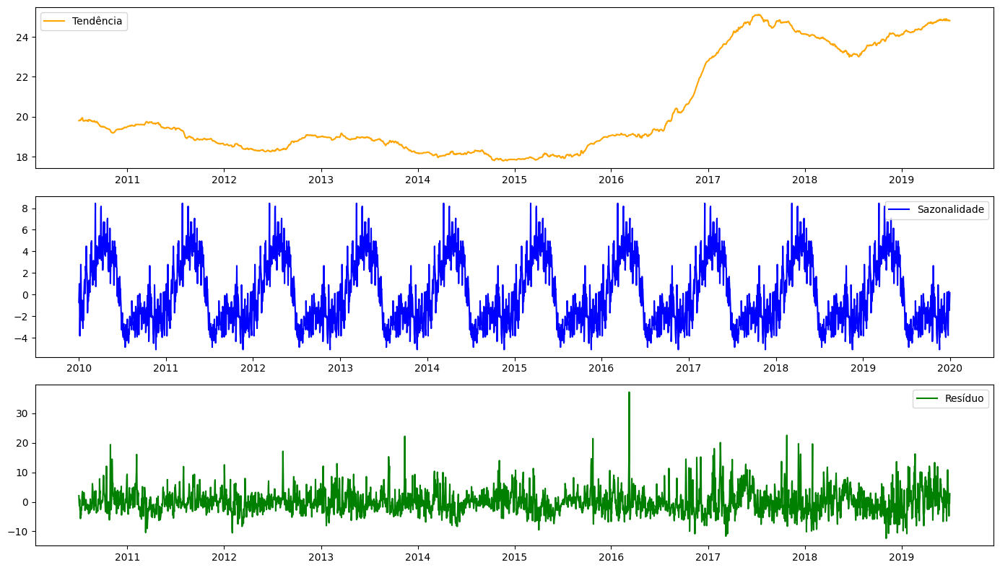

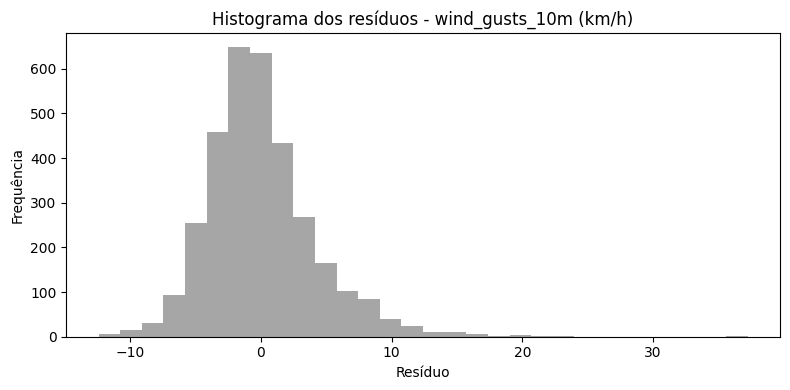

Shapiro-Wilk: stat=0.9455, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=782.1634, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=35.6775
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- soil_temperature_0_to_7cm (°C) ---


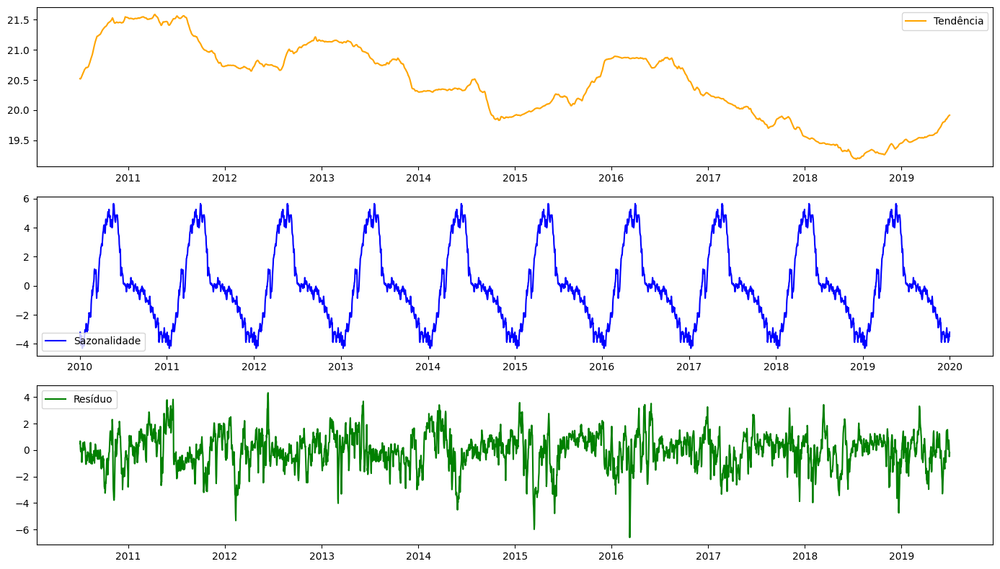

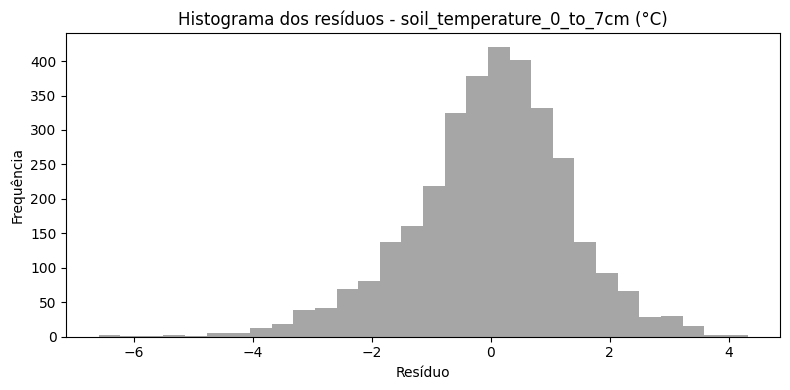

Shapiro-Wilk: stat=0.9853, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=168.1733, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=12.6022
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)

--- soil_moisture_0_to_7cm (m³/m³) ---


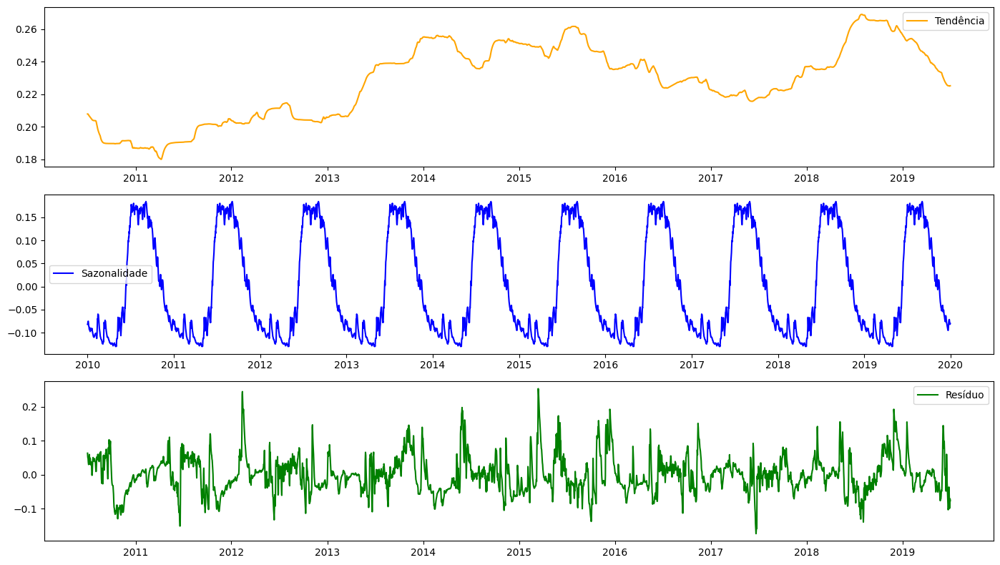

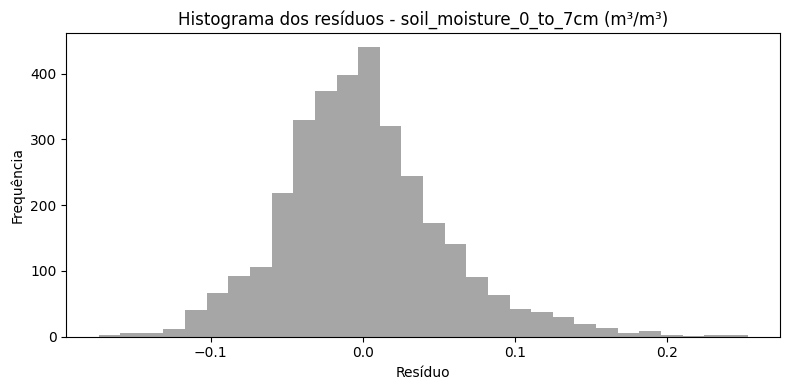

Shapiro-Wilk: stat=0.9767, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)
D'Agostino-Pearson: stat=269.0418, p=0.0000
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)
Anderson-Darling: stat=18.3838
Critérios:
  15.0%: 0.5750
  10.0%: 0.6550
  5.0%: 0.7860
  2.5%: 0.9170
  1.0%: 1.0910
Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)


{'temperature_2m (°C)': {'shapiro_p': np.float64(5.683309791718989e-22),
  'dagostino_p': np.float64(7.406328706348306e-71),
  'anderson_stat': np.float64(10.813698863532409),
  'anderson_critical_5': np.float64(0.786)},
 'relative_humidity_2m (%)': {'shapiro_p': np.float64(9.850664800282803e-10),
  'dagostino_p': np.float64(3.4179458626708983e-14),
  'anderson_stat': np.float64(4.036816389913838),
  'anderson_critical_5': np.float64(0.786)},
 'rain (mm)': {'shapiro_p': np.float64(3.3189273044511675e-59),
  'dagostino_p': np.float64(0.0),
  'anderson_stat': np.float64(209.61156856952084),
  'anderson_critical_5': np.float64(0.786)},
 'pressure_msl (hPa)': {'shapiro_p': np.float64(0.0006247449728679876),
  'dagostino_p': np.float64(6.181776502787821e-05),
  'anderson_stat': np.float64(0.557477440702769),
  'anderson_critical_5': np.float64(0.786)},
 'surface_pressure (hPa)': {'shapiro_p': np.float64(2.402094525720975e-09),
  'dagostino_p': np.float64(5.0918455926023544e-15),
  'anderson

In [215]:
def DecomposeAndTestNormalityARIMA(period=365):
    import pandas as pd
    import matplotlib.pyplot as plt
    from statsmodels.tsa.seasonal import seasonal_decompose
    from scipy.stats import shapiro, normaltest, anderson

    df = g_Dados.brutos()
    df['time'] = pd.to_datetime(df['time'])
    df = df.set_index('time')

    results = {}

    for column in df.columns:
        if column == 'time':
            continue
        # Resample para 1 dia
        daily_series = df[column].resample('1D').mean().dropna()
        if daily_series.shape[0] < period * 2:
            print(f"Coluna '{column}': dados insuficientes para decomposição (precisa de pelo menos {period*2} dias).")
            continue

        # Decomposição
        try:
            result = seasonal_decompose(daily_series, model='additive', period=period)
            residuals = result.resid.dropna()
        except Exception as e:
            print(f"Coluna '{column}': erro na decomposição - {e}")
            continue

        print(f"\n--- {column} ---")
        # Plots de tendência, sazonalidade e resíduo
        plt.figure(figsize=(14, 8))
        plt.subplot(311)
        plt.plot(result.trend, label='Tendência', color='orange')
        plt.legend()
        plt.subplot(312)
        plt.plot(result.seasonal, label='Sazonalidade', color='blue')
        plt.legend()
        plt.subplot(313)
        plt.plot(result.resid, label='Resíduo', color='green')
        plt.legend()
        plt.tight_layout()
        plt.show()

        # Histograma dos resíduos
        plt.figure(figsize=(8,4))
        plt.hist(residuals, bins=30, color='gray', alpha=0.7)
        plt.title(f'Histograma dos resíduos - {column}')
        plt.xlabel('Resíduo')
        plt.ylabel('Frequência')
        plt.tight_layout()
        plt.show()

        # Teste de Shapiro-Wilk
        shapiro_stat, shapiro_p = shapiro(residuals)
        print(f'Shapiro-Wilk: stat={shapiro_stat:.4f}, p={shapiro_p:.4f}')
        if shapiro_p < 0.05:
            print("Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Shapiro-Wilk)")
        else:
            print("Não rejeita H0: Os resíduos PODEM ser normalmente distribuídos (Shapiro-Wilk)")

        # Teste de D’Agostino e Pearson
        dagostino_stat, dagostino_p = normaltest(residuals)
        print(f"D'Agostino-Pearson: stat={dagostino_stat:.4f}, p={dagostino_p:.4f}")
        if dagostino_p < 0.05:
            print("Rejeita H0: Os resíduos NÃO são normalmente distribuídos (D'Agostino-Pearson)")
        else:
            print("Não rejeita H0: Os resíduos PODEM ser normalmente distribuídos (D'Agostino-Pearson)")

        # Teste de Anderson-Darling
        anderson_result = anderson(residuals)
        print(f'Anderson-Darling: stat={anderson_result.statistic:.4f}')
        print('Critérios:')
        for i, (cv, sig) in enumerate(zip(anderson_result.critical_values, anderson_result.significance_level)):
            print(f'  {sig}%: {cv:.4f}')
        if anderson_result.statistic > anderson_result.critical_values[2]:  # 5% nível de significância
            print("Rejeita H0: Os resíduos NÃO são normalmente distribuídos (Anderson-Darling, 5%)")
        else:
            print("Não rejeita H0: Os resíduos PODEM ser normalmente distribuídos (Anderson-Darling, 5%)")

        results[column] = {
            'shapiro_p': shapiro_p,
            'dagostino_p': dagostino_p,
            'anderson_stat': anderson_result.statistic,
            'anderson_critical_5': anderson_result.critical_values[2]
        }

    return results

# Exemplo de uso:
DecomposeAndTestNormalityARIMA(period=365)

In [ ]:
def TrainMultivariateARIMAXandForecast(target='temperature_2m (°C)', period=365):
    import pandas as pd
    import matplotlib.pyplot as plt
    from statsmodels.tsa.statespace.sarimax import SARIMAX

    # Carrega e prepara os dados
    df = g_Dados.brutos()
    df['time'] = pd.to_datetime(df['time'])
    df = df.set_index('time')
    weekly_df = df.resample('1H').mean().dropna()

    y = weekly_df[target]
    exog = weekly_df.drop(columns=[target, 'time'], errors='ignore')

    # Define tamanho do teste (1 ano = 52 semanas)
    test_size = 52 * 7
    train_y = y.iloc[:-test_size]
    train_exog = exog.iloc[:-test_size]
    test_y = y.iloc[-test_size:]
    test_exog = exog.iloc[-test_size:]

    # Ajusta o modelo uma única vez com os dados de treino
    model = SARIMAX(train_y, exog=train_exog, order=(1,0,0), seasonal_order=(0,0,0,0),
                    enforce_stationarity=False, enforce_invertibility=False)
    results = model.fit(disp=False)

    # Previsão ponto a ponto (one-step ahead) para o conjunto de teste
    preds = []
    for i in range(test_size):
        next_exog = test_exog.iloc[i:i+1]
        forecast = results.get_forecast(steps=1, exog=next_exog)
        pred = forecast.predicted_mean.iloc[0]
        preds.append(pred)

    indices = test_y.index
    actuals = test_y.values

    # Plota treino, teste real e previsões
    plt.figure(figsize=(14,6))
    plt.plot(train_y.index, train_y.values, label='Treino', color='gray')
    plt.plot(indices, actuals, label='Real (Teste)', color='blue')
    plt.plot(indices, preds, label='Previsto (Teste)', color='orange')
    plt.title(f'ARIMAX: Treino, Real e Previsão ponto a ponto para {target} (último ano)')
    plt.xlabel('Data')
    plt.ylabel(target)
    plt.legend()
    plt.tight_layout()
    plt.show()

    mae = sum(abs(a-p) for a,p in zip(actuals, preds)) / len(preds)
    print(f"MAE: {mae:.2f}")

# Exemplo de uso:
TrainMultivariateARIMAXandForecast(target='temperature_2m (°C)', period=365)

/tmp/ipykernel_13075/4212070614.py:10: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  weekly_df = df.resample('1H').mean().dropna()


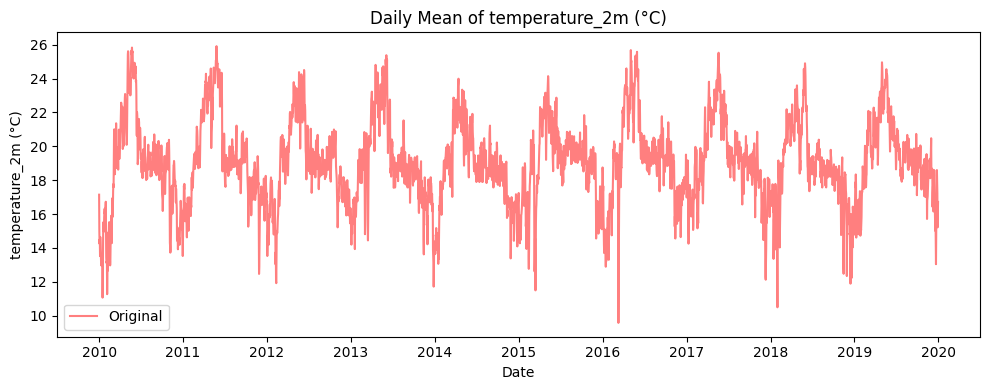

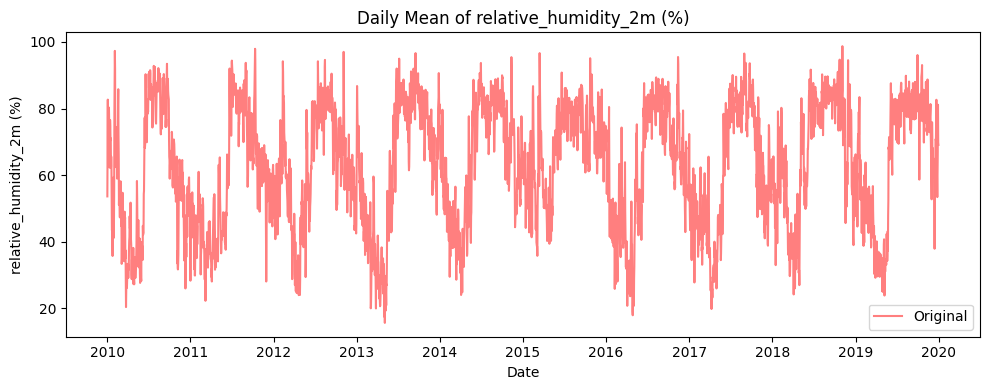

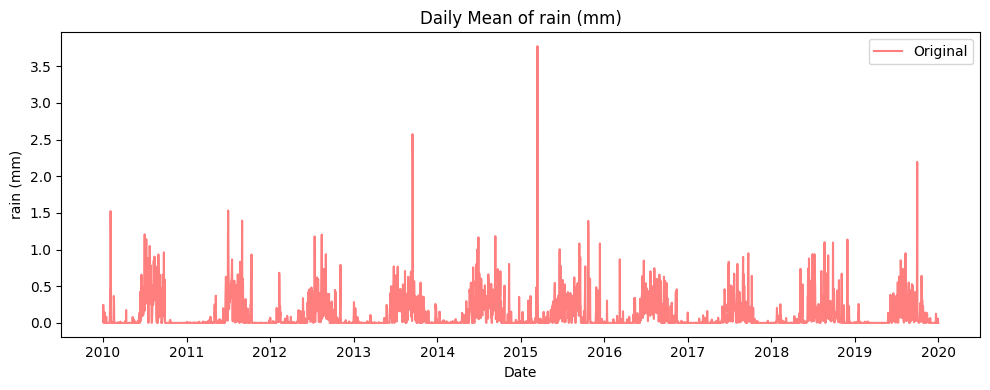

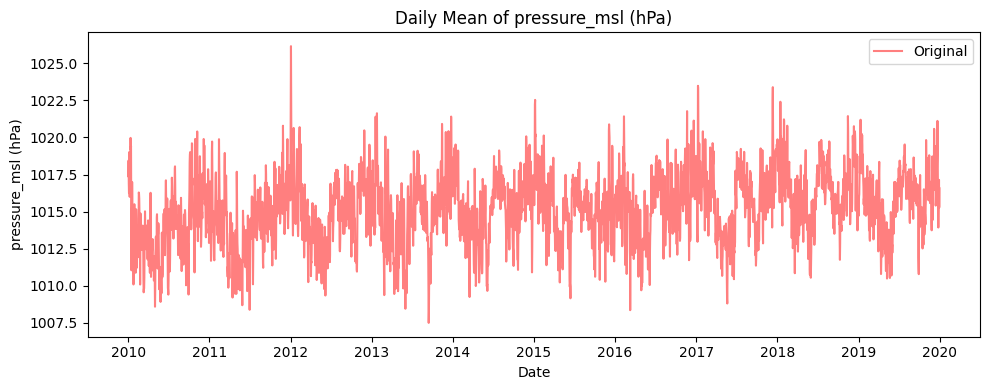

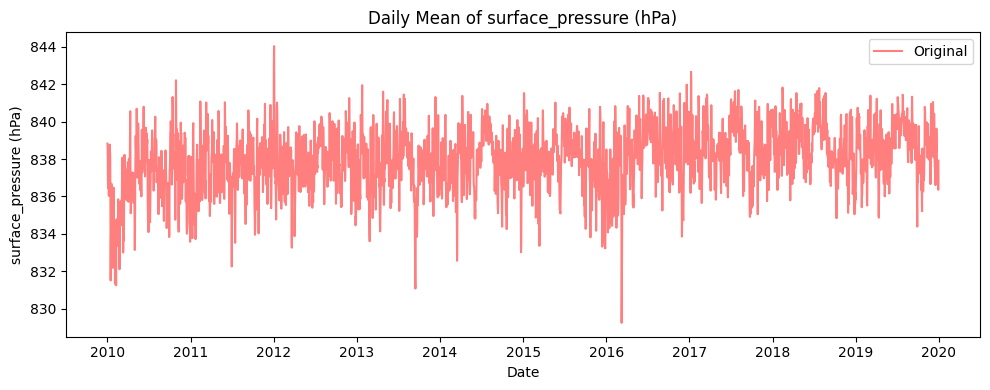

...

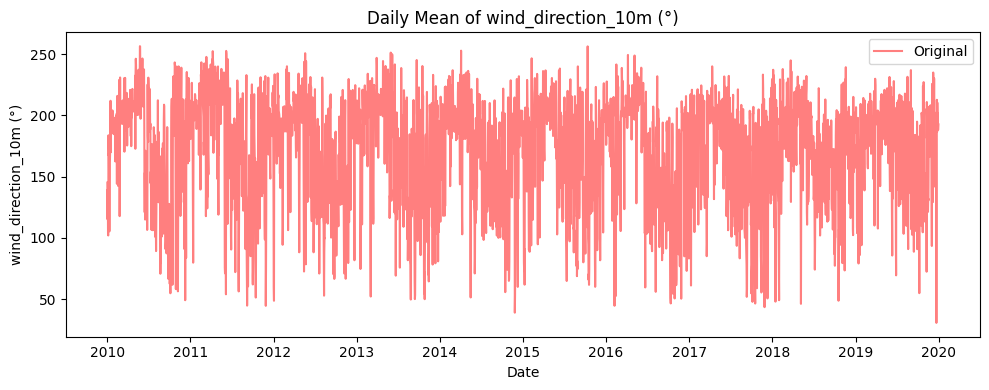

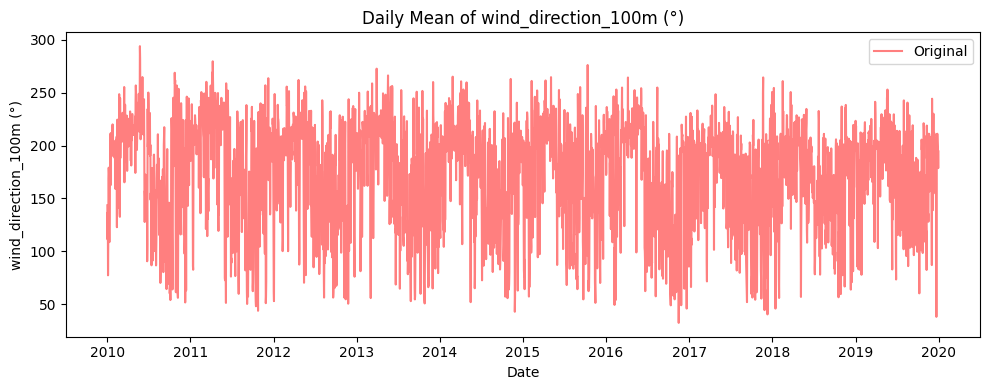

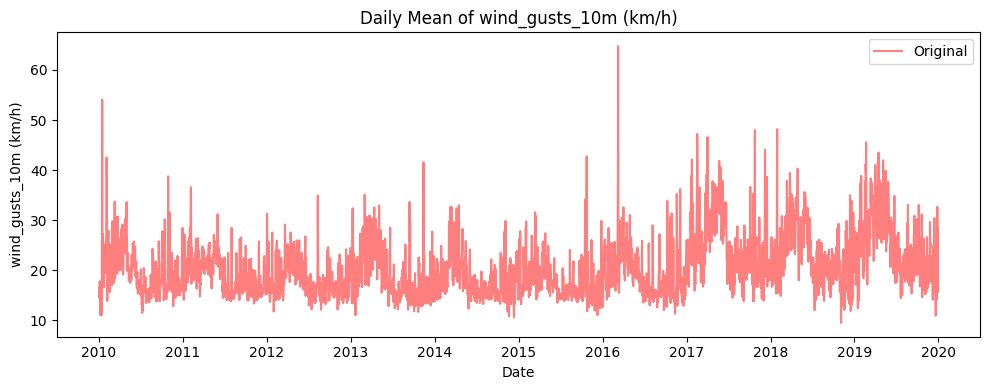

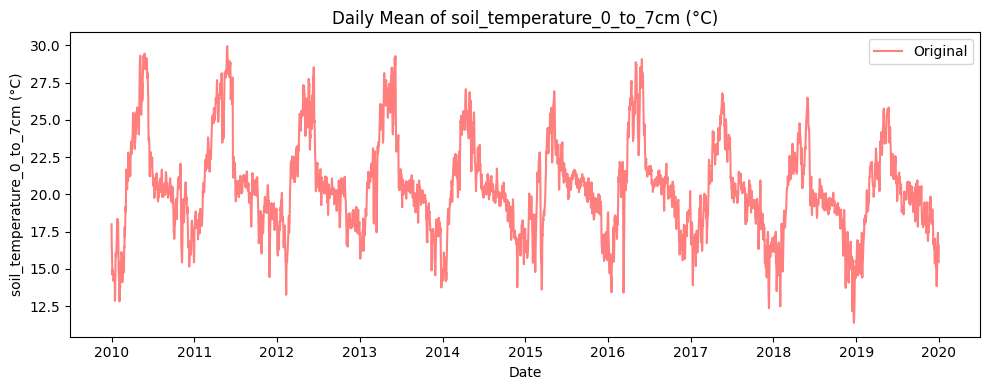

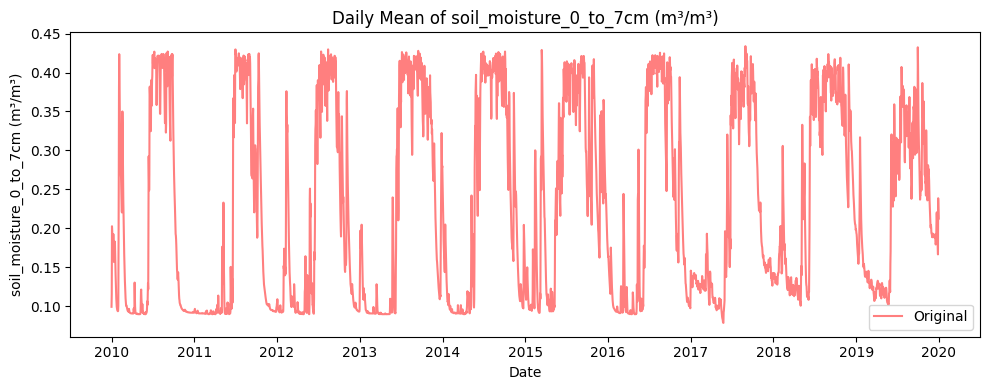

In [ ]:
def PlotFeatures():
    import matplotlib.pyplot as plt
    import pandas as pd

    # Prepare both datasets
    raw_data = g_Dados.brutos()
    outlier_fixed_data = no_outliers_df

    # Ensure 'time' is datetime and set as index for both
    raw_data['time'] = pd.to_datetime(raw_data['time'])
    raw_data = raw_data.set_index('time')
    outlier_fixed_data['time'] = pd.to_datetime(outlier_fixed_data['time'])
    outlier_fixed_data = outlier_fixed_data.set_index('time')

    for column in raw_data.columns:
        if column != 'time':
            # Resample hourly data to daily mean for both datasets
            daily_raw = raw_data[column].resample('1D').mean()
            daily_outlier_fixed = outlier_fixed_data[column].resample('1D').mean()

            plt.figure(figsize=(10, 4))
            plt.plot(daily_raw.index, daily_raw.values, label='Original', alpha=0.5, color='red')
            #plt.plot(daily_outlier_fixed.index, daily_outlier_fixed.values, label='Outliers Imputed', linestyle='--', alpha=0.5, color='blue')
            plt.title(f'Daily Mean of {column}')
            plt.xlabel('Date')
            plt.ylabel(column)
            plt.legend()
            plt.tight_layout()
            plt.show()

PlotFeatures()